In [1]:
import os
import geopandas as gpd
import urbanpy as up
import pandas as pd
import contextily as ctx
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import osmnx as ox
from shapely.geometry import box
from mpl_toolkits.axes_grid1 import make_axes_locatable
from tqdm.auto import tqdm
from pandarallel import pandarallel

tqdm.pandas()

pandarallel.initialize(progress_bar=True)

INFO: Pandarallel will run on 10 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.


In [2]:
amazonia_complete_hexs = gpd.read_parquet("outputs/amazonia_hexs_7.parquet")

In [3]:
amazonia_complete_hexs.head()

,country,hex,pob_primaria,pob_secundaria,closest_primary_school_id,closest_primary_school_dist,closest_secondary_school_id,closest_secondary_school_dist,lat,lon,geometry,closest_primary_school_dist_cat,closest_secondary_school_dist_cat,closest_primary_school_dist_clipped
48,bol,878b5198effffff,2.741987,5.156576,7740,2.889678,2887,3.953064,-10.642396,-67.661762,"POLYGON ((-67.66756 -10.63040, -67.67483 -10.6...","(2.5, 5.0]","(2.5, 5.0]",2.889678
49,bol,878b5462affffff,3.236444,5.970002,6812,3.457587,2401,3.457587,-11.550858,-66.639837,"POLYGON ((-66.64563 -11.53897, -66.65281 -11.5...","(2.5, 5.0]","(2.5, 5.0]",3.457587
50,bol,878b51c8cffffff,0.632385,1.189262,7745,12.906098,2882,12.906098,-10.436717,-67.255911,"POLYGON ((-67.26169 -10.42475, -67.26892 -10.4...","(10.0, 20.0]","(10.0, 20.0]",12.906098
52,bol,878b24ad2ffffff,9.695145,18.402893,592,1.781965,147,8.216429,-19.165915,-64.641337,"POLYGON ((-64.64722 -19.15472, -64.65436 -19.1...","(0.0, 2.5]","(5.0, 10.0]",1.781965
53,bol,878b2ea82ffffff,1.375671,2.702648,5105,9.123796,2439,16.790068,-16.486472,-65.368380,"POLYGON ((-65.37423 -16.47498, -65.38139 -16.4...","(5.0, 10.0]","(10.0, 20.0]",9.123796


In [4]:
bol_hexs_amazonia = gpd.read_parquet("outputs/bol_hexs_amazonia.parquet")
bra_hexs_amazonia = gpd.read_parquet("outputs/bra_hexs_amazonia.parquet")
col_hexs_amazonia = gpd.read_parquet("outputs/col_hexs_amazonia.parquet")
ecu_hexs_amazonia = gpd.read_parquet("outputs/ecu_hexs_amazonia.parquet")
guy_hexs_amazonia = gpd.read_parquet("outputs/guy_hexs_amazonia.parquet")
per_hexs_amazonia = gpd.read_parquet("outputs/per_hexs_amazonia.parquet")
sur_hexs_amazonia = gpd.read_parquet("outputs/sur_hexs_amazonia.parquet")
ven_hexs_amazonia = gpd.read_parquet("outputs/ven_hexs_amazonia.parquet")

In [5]:
# Load the data
amazonas_limits = gpd.read_parquet("outputs/amazonas_clean.parquet")
amzn_countries = gpd.read_parquet("outputs/amazon_countries.parquet")

In [6]:
territorios_indigenas = gpd.read_file("inputs/Territorios Indigenas")

In [7]:
# Verify CRS of new dataset
territorios_indigenas.crs.to_string(), amazonas_limits.crs.to_string()

('EPSG:3857', 'EPSG:4326')

In [8]:
# Reproject to the main CRS
territorios_indigenas = territorios_indigenas.to_crs(amazonas_limits.crs.to_string())

<Axes: >

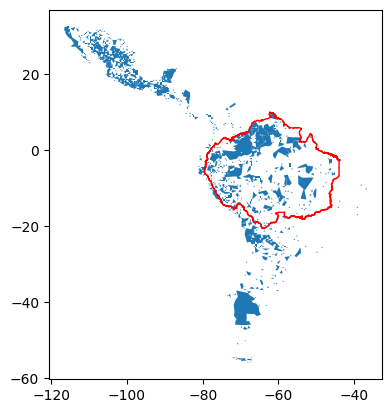

In [9]:
# Check new dataset and amazon limits
ax = territorios_indigenas.plot()
amazonas_limits.plot(ax=ax, edgecolor="red", facecolor="none")

In [10]:
# Filter new territorios indigenias that intersect with the amazonas limits
territorios_indigenas_amazonas = territorios_indigenas[
    territorios_indigenas.intersects(amazonas_limits.iloc[0].geometry)
]
territorios_indigenas_amazonas.shape

(264, 6)

<Axes: >

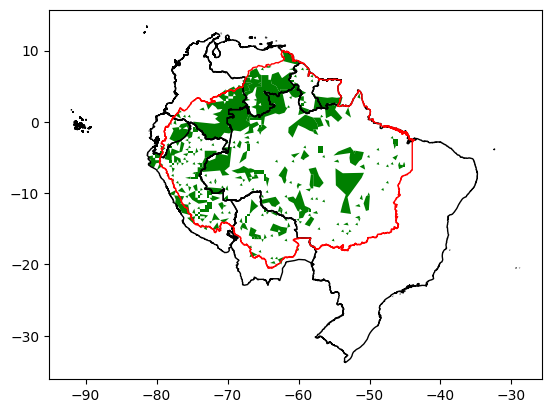

In [11]:
# Check result
ax = territorios_indigenas_amazonas.plot(color="green")
amzn_countries.plot(ax=ax, edgecolor="black", facecolor="none")
amazonas_limits.plot(ax=ax, edgecolor="red", facecolor="none")

In [12]:
territorios_indigenas_amazonas_proj = ox.project_gdf(territorios_indigenas_amazonas)
amazonas_limits_proj = ox.project_gdf(amazonas_limits)
amzn_countries_proj = ox.project_gdf(amzn_countries)

In [13]:
territorios_indigenas_data = []

In [14]:
total_area_amazonas = amazonas_limits_proj.geometry.area.sum() / 1e6
total_area_territorios_indigenas = (
    territorios_indigenas_amazonas_proj.geometry.area.sum() / 1e6
)

print(
    f"Total area of amazonas: {amazonas_limits_proj.geometry.area.sum() / 1e6:.2f} km²"
)
print(
    f"Total area of territorios indigenas: {total_area_territorios_indigenas:.2f} km² ({total_area_territorios_indigenas / total_area_amazonas:.2%})"
)

Total area of amazonas: 8519947.66 km²
Total area of territorios indigenas: 2293601.76 km² (26.92%)


In [15]:
territorios_indigenas_data.append(
    (
        "TOTAL",
        total_area_amazonas,
        total_area_territorios_indigenas,
        total_area_territorios_indigenas / total_area_amazonas,
    )
)

In [16]:
print("Total area of territorios indigenas per country")

# Calculate the territorios indigenas area per country
for i, country in amzn_countries_proj.iterrows():

    country_name = country["ADM0_PCODE"]

    territorios_indigenas_in_country = territorios_indigenas_amazonas_proj.clip(
        country.geometry
    )
    territorios_indigenas_area = (
        territorios_indigenas_in_country.geometry.area.sum() / 1e6
    )

    country_area = country.geometry.area / 1e6

    print(
        f"{country_name}: {country_area:.2f} of {country_area:.2f} km² ({territorios_indigenas_area / country_area:.2%})"
    )

    territorios_indigenas_data.append(
        (
            country_name,
            country_area,
            territorios_indigenas_area,
            territorios_indigenas_area / country_area,
        )
    )

Total area of territorios indigenas per country
BO: 1084062.95 of 1084062.95 km² (9.39%)
BR: 8960680.34 of 8960680.34 km² (12.10%)
CO: 1175875.68 of 1175875.68 km² (24.64%)
EC: 276793.78 of 276793.78 km² (25.18%)
GY: 211363.24 of 211363.24 km² (20.79%)
PE: 1340740.61 of 1340740.61 km² (25.28%)
SR: 148616.10 of 148616.10 km² (29.04%)
VE: 918748.57 of 918748.57 km² (34.70%)


In [17]:
territorios_indigenas_df = pd.DataFrame(
    territorios_indigenas_data,
    columns=[
        "Country",
        "Country Area",
        "Territorios Indigenas Area",
        "Territorios Indigenas Area %",
    ],
)
territorios_indigenas_df.to_excel(
    "outputs/territorios_indigenas_amazonas_areas.xlsx", index=False
)

In [18]:
# Add a boolean variable "territorio_indigena" to each hexagon
amazonia_complete_hexs["territorio_indigena"] = 0
for index, territorio in tqdm(
    territorios_indigenas_amazonas.iterrows(),
    total=territorios_indigenas_amazonas.shape[0],
):
    filter_within = amazonia_complete_hexs.within(territorio.geometry)
    amazonia_complete_hexs.loc[filter_within, "territorio_indigena"] = 1

  0%|          | 0/264 [00:00<?, ?it/s]

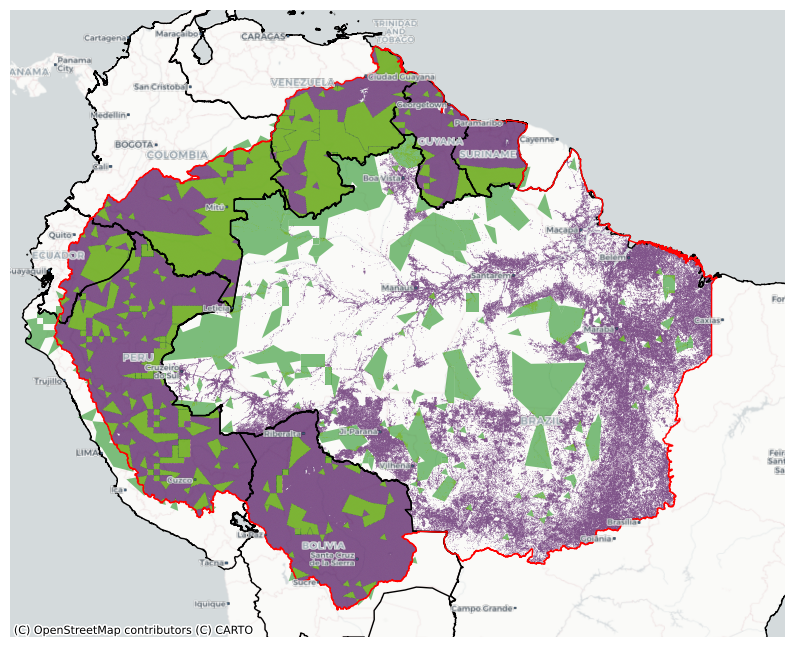

In [19]:
# Check result
ax = amazonia_complete_hexs.plot(
    "territorio_indigena",
    cmap="viridis",
    legend=False,
    categorical=True,
    figsize=(10, 10),
)
territorios_indigenas_amazonas.plot(ax=ax, color="green", alpha=0.5)
amzn_countries.plot(ax=ax, edgecolor="black", facecolor="none")
amazonas_limits.plot(ax=ax, edgecolor="red", facecolor="none")

# Zoom to territorios_indigenas_amazonas
# xmin, ymin, xmax, ymax = territorios_indigenas_amazonas.total_bounds
# ax.set_xlim(xmin, xmax)
# ax.set_ylim(ymin, ymax)
ax.set_xlim(-82, -40)
ax.set_ylim(-22, 12)

ctx.add_basemap(
    ax,
    crs=amazonia_complete_hexs.crs.to_string(),
    source=ctx.providers.CartoDB.Positron,
)
ctx.add_basemap(
    ax,
    crs=amazonia_complete_hexs.crs.to_string(),
    source=ctx.providers.CartoDB.PositronOnlyLabels,
)
ax.set_axis_off()

plt.savefig(
    "outputs/map_territorio_indigena.png",
    dpi=300,
    bbox_inches="tight",
)
plt.savefig(
    "outputs/map_territorio_indigena.svg",
    dpi=300,
    bbox_inches="tight",
)

In [20]:
# Calculate the population for each distance category
pop_primaria_by_duration_country_territorio_indigena = (
    amazonia_complete_hexs.groupby(
        ["country", "territorio_indigena", "closest_primary_school_dist_cat"]
    )["pob_primaria"]
    .sum()
    .reset_index()
)
pop_primaria_by_duration_country_territorio_indigena["population_label"] = (
    "Primary School Population"
)

<Figure size 1400x700 with 0 Axes>

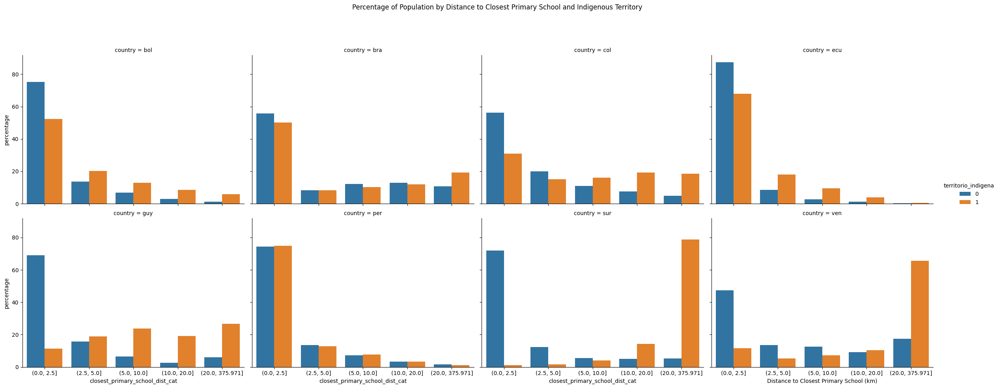

In [21]:
# Assuming the data is in the 'df' variable

# Calculate the total population by country and territory
total_population = (
    pop_primaria_by_duration_country_territorio_indigena.groupby(
        ["country", "territorio_indigena"]
    )["pob_primaria"]
    .sum()
    .reset_index()
)

# Merge the total population back to the original dataframe
df = pop_primaria_by_duration_country_territorio_indigena.merge(
    total_population, on=["country", "territorio_indigena"], suffixes=("", "_total")
)

# Calculate the percentage of population in each distance category
df["percentage"] = (df["pob_primaria"] / df["pob_primaria_total"]) * 100

# Create the plot
plt.figure(figsize=(14, 7))
sns.catplot(
    data=df,
    x="closest_primary_school_dist_cat",
    y="percentage",
    hue="territorio_indigena",
    col="country",
    kind="bar",
    height=5,
    aspect=1.2,
    order=[
        "(0.0, 2.5]",
        "(2.5, 5.0]",
        "(5.0, 10.0]",
        "(10.0, 20.0]",
        "(20.0, 375.971]",
    ],
    col_wrap=4,
)

# Adjust the labels and titles
plt.subplots_adjust(top=0.85)
plt.suptitle(
    "Percentage of Population by Distance to Closest Primary School and Indigenous Territory"
)
plt.xlabel("Distance to Closest Primary School (km)")
plt.ylabel("Percentage of Primary School Population")

# Save the plot
plt.savefig(
    "outputs/pop_primaria_by_duration_country_territorio_indigena.png",
    dpi=300,
    bbox_inches="tight",
    format="png",
)
plt.savefig(
    "outputs/pop_primaria_by_duration_country_territorio_indigena.svg",
    dpi=300,
    bbox_inches="tight",
    format="svg",
)

# Show the plot
plt.show()

In [22]:
df.to_excel("outputs/pop_primaria_by_school_dist_country_territorio_indigena.xlsx")

In [23]:
# Calculate the population for each distance category
pop_secundaria_by_duration_country_territorio_indigena = (
    amazonia_complete_hexs.groupby(
        ["country", "territorio_indigena", "closest_secondary_school_dist_cat"]
    )["pob_secundaria"]
    .sum()
    .reset_index()
)
pop_secundaria_by_duration_country_territorio_indigena["population_label"] = (
    "Secondary School Population"
)

<Figure size 1400x700 with 0 Axes>

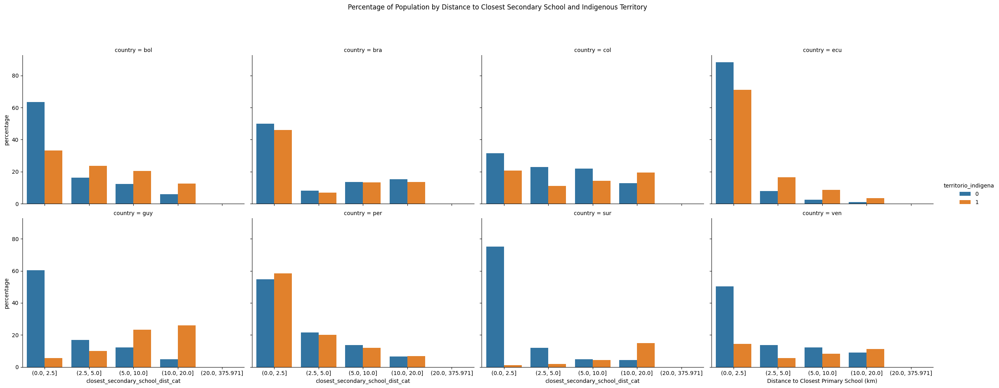

In [24]:
# Assuming the data is in the 'df' variable

# Calculate the total population by country and territory
total_population = (
    pop_secundaria_by_duration_country_territorio_indigena.groupby(
        ["country", "territorio_indigena"]
    )["pob_secundaria"]
    .sum()
    .reset_index()
)

# Merge the total population back to the original dataframe
df = pop_secundaria_by_duration_country_territorio_indigena.merge(
    total_population, on=["country", "territorio_indigena"], suffixes=("", "_total")
)

# Calculate the percentage of population in each distance category
df["percentage"] = (df["pob_secundaria"] / df["pob_secundaria_total"]) * 100

# Create the plot
plt.figure(figsize=(14, 7))
sns.catplot(
    data=df,
    x="closest_secondary_school_dist_cat",
    y="percentage",
    hue="territorio_indigena",
    col="country",
    kind="bar",
    height=5,
    aspect=1.2,
    order=[
        "(0.0, 2.5]",
        "(2.5, 5.0]",
        "(5.0, 10.0]",
        "(10.0, 20.0]",
        "(20.0, 375.971]",
    ],
    col_wrap=4,
)

# Adjust the labels and titles
plt.subplots_adjust(top=0.85)
plt.suptitle(
    "Percentage of Population by Distance to Closest Secondary School and Indigenous Territory"
)
plt.xlabel("Distance to Closest Primary School (km)")
plt.ylabel("Percentage of Primary School Population")

# Save the plot
plt.savefig(
    "outputs/pop_secundaria_by_school_dist_country_territorio_indigena.png",
    dpi=300,
    bbox_inches="tight",
    format="png",
)
plt.savefig(
    "outputs/pop_secundaria_by_school_dist_country_territorio_indigena.svg",
    dpi=300,
    bbox_inches="tight",
    format="svg",
)

# Show the plot
plt.show()

In [25]:
df.to_excel("outputs/pop_secundaria_by_school_dist_country_territorio_indigena.xlsx")

## Protected areas analysis


In [26]:
protected_areas = gpd.read_file("inputs/AreasProtegidasFixed/AreasProtegidasFixed.shp")

In [27]:
# Verify CRS of new dataset
protected_areas.crs.to_string(), amazonas_limits.crs.to_string()

('EPSG:4326', 'EPSG:4326')

<Axes: >

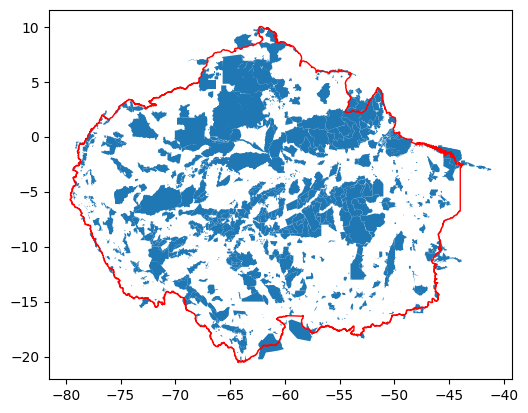

In [28]:
# Check new dataset and amazon limits
ax = protected_areas.plot()
amazonas_limits.plot(ax=ax, edgecolor="red", facecolor="none")

In [29]:
protected_areas.shape

(1379, 5)

In [30]:
# Filter new territorios indigenias that intersect with the amazonas limits
protected_areas_amazonas = protected_areas[
    protected_areas.intersects(amazonas_limits.iloc[0].geometry)
]
protected_areas_amazonas.shape

(1376, 5)

(-20.455687301999944, 9.968543871000065)

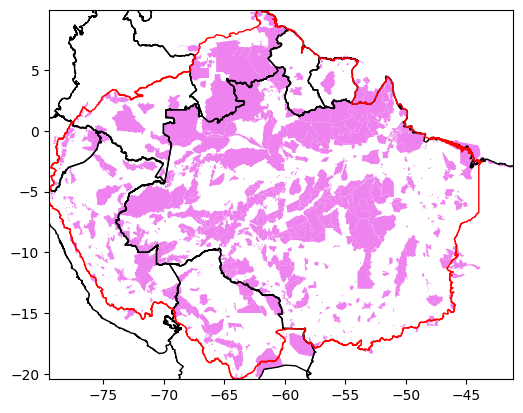

In [31]:
# Check result
ax = protected_areas_amazonas.plot(color="violet")
amzn_countries.plot(ax=ax, edgecolor="black", facecolor="none")
amazonas_limits.plot(ax=ax, edgecolor="red", facecolor="none")
# Zoom to territorios_indigenas_amazonas
xmin, ymin, xmax, ymax = protected_areas_amazonas.total_bounds
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

In [32]:
protected_areas_amazonas.shape

(1376, 5)

In [33]:
protected_areas_amazonas

,NAME,DESIG,DESIG_ENG,IUCN_CAT,geometry
0,Huaripampa,Parque Municipal,Municipal Park,Not Reported,"POLYGON ((-68.11905 -16.44269, -68.13644 -16.4..."
1,El Dorado,Wildlife Refuge,Wildlife Refuge,IV,"POLYGON ((-67.09623 -12.90364, -67.03934 -12.9..."
2,Estancias Elsner Espírir,Wildlife Refuge,Wildlife Refuge,IV,"POLYGON ((-66.10851 -13.85963, -66.10305 -13.9..."
3,Estancias San Rafael,Wildlife Refuge,Wildlife Refuge,IV,"POLYGON ((-64.61743 -15.22636, -64.57197 -15.2..."
4,Santa Cruz la Vieja,National Historical Park,National Historical Park,Not Reported,"POLYGON ((-60.83308 -17.85163, -61.04829 -17.8..."
...,...,...,...,...,...
1374,Comunal Alto Tamaya - Abujao,Área de Conservación Regional,Regional Conservation Area,VI,"POLYGON ((-73.44948 -8.63212, -73.45018 -8.632..."
1375,Bosque Nublado Amaru-Huachocolpa-Chihuana,Área de Conservación Regional,Regional Conservation Area,VI,"POLYGON ((-74.49921 -12.07197, -74.49890 -12.0..."
1376,Campo Verde,Área de Conservación Privada,Private Conservation Area,VI,"POLYGON ((-74.55703 -8.55987, -74.65790 -8.586..."
1377,Guyane (Parc Amazonien) [Aire D'Adhésion],"Parc national, aire d'adhésion",National Park - Buffer zone/Area of adhesion,V,"MULTIPOLYGON (((-53.99857 4.28743, -53.99776 4..."


In [34]:
protected_areas_amazonas.assign(protected_area=1)

,NAME,DESIG,DESIG_ENG,IUCN_CAT,geometry,protected_area
0,Huaripampa,Parque Municipal,Municipal Park,Not Reported,"POLYGON ((-68.11905 -16.44269, -68.13644 -16.4...",1
1,El Dorado,Wildlife Refuge,Wildlife Refuge,IV,"POLYGON ((-67.09623 -12.90364, -67.03934 -12.9...",1
2,Estancias Elsner Espírir,Wildlife Refuge,Wildlife Refuge,IV,"POLYGON ((-66.10851 -13.85963, -66.10305 -13.9...",1
3,Estancias San Rafael,Wildlife Refuge,Wildlife Refuge,IV,"POLYGON ((-64.61743 -15.22636, -64.57197 -15.2...",1
4,Santa Cruz la Vieja,National Historical Park,National Historical Park,Not Reported,"POLYGON ((-60.83308 -17.85163, -61.04829 -17.8...",1
...,...,...,...,...,...,...
1374,Comunal Alto Tamaya - Abujao,Área de Conservación Regional,Regional Conservation Area,VI,"POLYGON ((-73.44948 -8.63212, -73.45018 -8.632...",1
1375,Bosque Nublado Amaru-Huachocolpa-Chihuana,Área de Conservación Regional,Regional Conservation Area,VI,"POLYGON ((-74.49921 -12.07197, -74.49890 -12.0...",1
1376,Campo Verde,Área de Conservación Privada,Private Conservation Area,VI,"POLYGON ((-74.55703 -8.55987, -74.65790 -8.586...",1
1377,Guyane (Parc Amazonien) [Aire D'Adhésion],"Parc national, aire d'adhésion",National Park - Buffer zone/Area of adhesion,V,"MULTIPOLYGON (((-53.99857 4.28743, -53.99776 4...",1


In [35]:
protected_areas_amazonas = protected_areas_amazonas.assign(protected_area=1)

In [36]:
# Add a boolean variable "protected_areas" to each hexagon
amazonia_complete_hexs = (
    amazonia_complete_hexs.sjoin(
        protected_areas_amazonas[["protected_area", "geometry"]],
        how="left",
        predicate="within",
    )
    .drop(columns=["index_right"])
    .drop_duplicates(subset=["hex"])
)
amazonia_complete_hexs.loc[:, "protected_area"] = amazonia_complete_hexs[
    "protected_area"
].fillna(0)

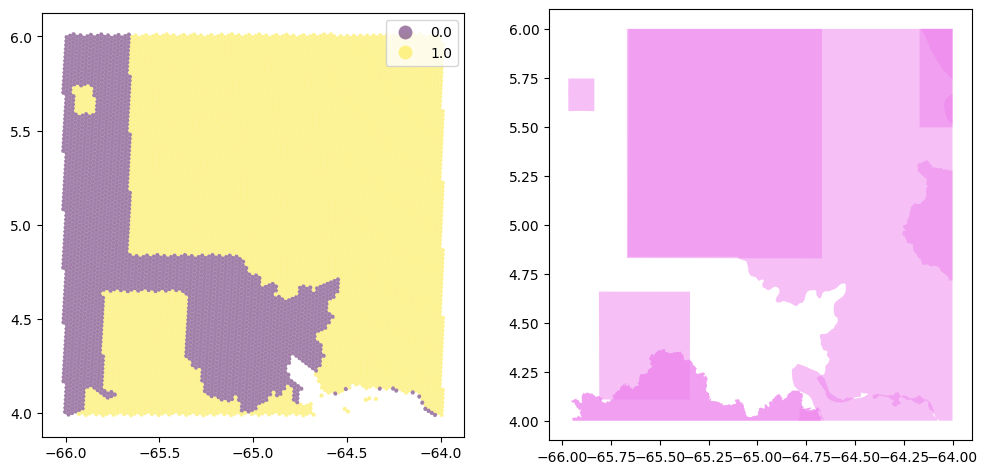

In [37]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

amazonia_complete_hexs.drop_duplicates(subset=["hex"]).cx[-64:-66, 4:6].plot(
    "protected_area", cmap="viridis", legend=True, categorical=True, alpha=0.5, ax=ax1
)

bbox = box(-64, 4, -66, 6)
ax2 = protected_areas_amazonas.clip(bbox).plot(color="violet", alpha=0.5, ax=ax2)

plt.show()

<Axes: >

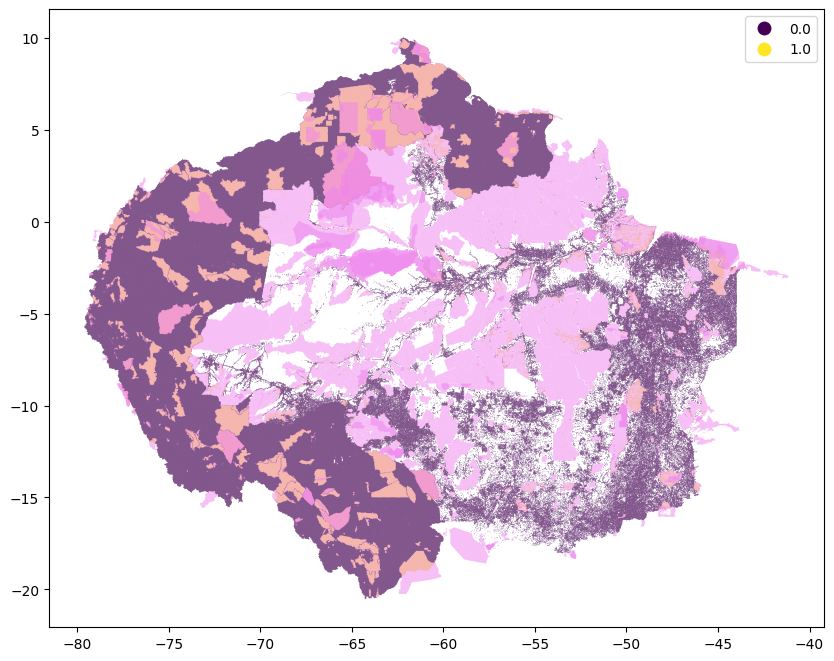

In [38]:
# Check result
ax = amazonia_complete_hexs.plot(
    "protected_area",
    cmap="viridis",
    legend=True,
    categorical=True,
    figsize=(10, 10),
)
protected_areas_amazonas.plot(ax=ax, color="violet", alpha=0.5)
# amzn_countries.plot(ax=ax, edgecolor="black", facecolor="none")
# amazonas_limits.plot(ax=ax, edgecolor="red", facecolor="none")

In [39]:
# Calculate the population for each distance category
pop_primaria_by_duration_country_protected_areas = (
    amazonia_complete_hexs.groupby(
        ["country", "protected_area", "closest_primary_school_dist_cat"]
    )["pob_primaria"]
    .sum()
    .reset_index()
)
pop_primaria_by_duration_country_protected_areas["population_label"] = (
    "Primary School Population"
)

<Figure size 1400x700 with 0 Axes>

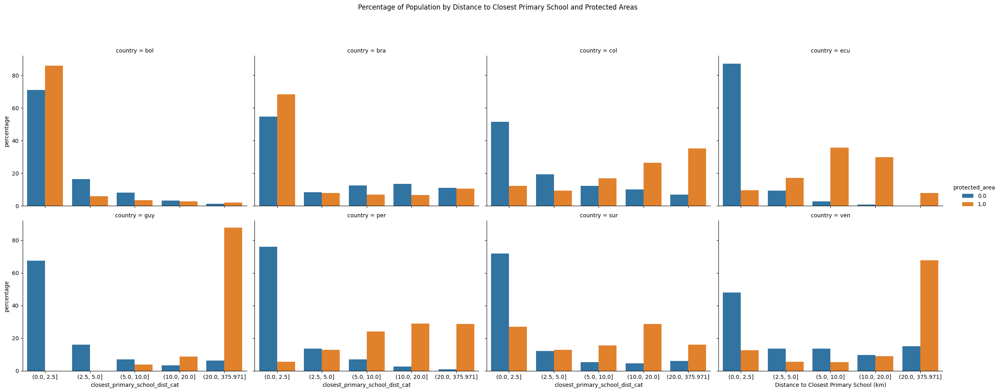

In [40]:
# Assuming the data is in the 'df' variable

# Calculate the total population by country and territory
total_population = (
    pop_primaria_by_duration_country_protected_areas.groupby(
        ["country", "protected_area"]
    )["pob_primaria"]
    .sum()
    .reset_index()
)

# Merge the total population back to the original dataframe
df = pop_primaria_by_duration_country_protected_areas.merge(
    total_population, on=["country", "protected_area"], suffixes=("", "_total")
)

# Calculate the percentage of population in each distance category
df["percentage"] = (df["pob_primaria"] / df["pob_primaria_total"]) * 100

# Create the plot
plt.figure(figsize=(14, 7))
sns.catplot(
    data=df,
    x="closest_primary_school_dist_cat",
    y="percentage",
    hue="protected_area",
    col="country",
    kind="bar",
    height=5,
    aspect=1.2,
    order=[
        "(0.0, 2.5]",
        "(2.5, 5.0]",
        "(5.0, 10.0]",
        "(10.0, 20.0]",
        "(20.0, 375.971]",
    ],
    col_wrap=4,
)

# Adjust the labels and titles
plt.subplots_adjust(top=0.85)
plt.suptitle(
    "Percentage of Population by Distance to Closest Primary School and Protected Areas"
)
plt.xlabel("Distance to Closest Primary School (km)")
plt.ylabel("Percentage of Primary School Population")

# Save the plot
plt.savefig(
    "outputs/pop_primaria_by_school_dist_country_protected_areas.png",
    dpi=300,
    bbox_inches="tight",
    format="png",
)
plt.savefig(
    "outputs/pop_primaria_by_school_dist_country_protected_areas.svg",
    dpi=300,
    bbox_inches="tight",
    format="svg",
)

# Show the plot
plt.show()

In [41]:
df.to_excel("outputs/pop_primaria_by_school_dist_country_protected_areas.xlsx")

In [42]:
# Calculate the population for each distance category
pop_secundaria_by_duration_country_protected_areas = (
    amazonia_complete_hexs.groupby(
        ["country", "protected_area", "closest_secondary_school_dist_cat"]
    )["pob_secundaria"]
    .sum()
    .reset_index()
)
pop_secundaria_by_duration_country_protected_areas["population_label"] = (
    "Secondary School Population"
)

<Figure size 1400x700 with 0 Axes>

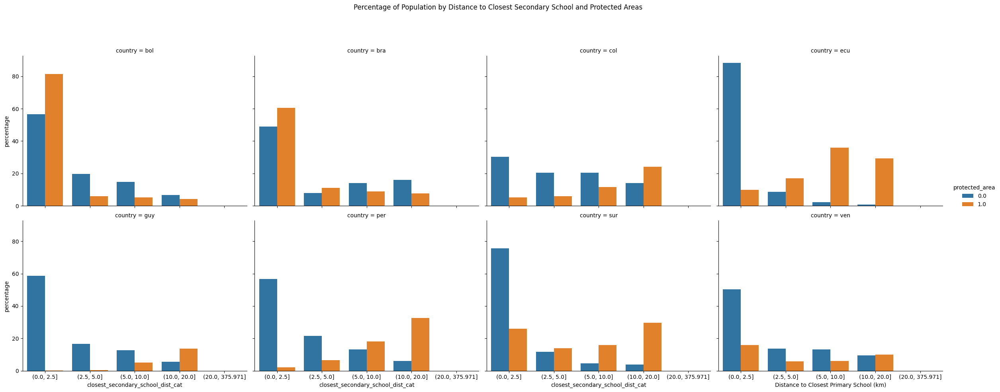

In [43]:
# Assuming the data is in the 'df' variable

# Calculate the total population by country and territory
total_population = (
    pop_secundaria_by_duration_country_protected_areas.groupby(
        ["country", "protected_area"]
    )["pob_secundaria"]
    .sum()
    .reset_index()
)

# Merge the total population back to the original dataframe
df = pop_secundaria_by_duration_country_protected_areas.merge(
    total_population, on=["country", "protected_area"], suffixes=("", "_total")
)

# Calculate the percentage of population in each distance category
df["percentage"] = (df["pob_secundaria"] / df["pob_secundaria_total"]) * 100

# Create the plot
plt.figure(figsize=(14, 7))
sns.catplot(
    data=df,
    x="closest_secondary_school_dist_cat",
    y="percentage",
    hue="protected_area",
    col="country",
    kind="bar",
    height=5,
    aspect=1.2,
    order=[
        "(0.0, 2.5]",
        "(2.5, 5.0]",
        "(5.0, 10.0]",
        "(10.0, 20.0]",
        "(20.0, 375.971]",
    ],
    col_wrap=4,
)

# Adjust the labels and titles
plt.subplots_adjust(top=0.85)
plt.suptitle(
    "Percentage of Population by Distance to Closest Secondary School and Protected Areas"
)
plt.xlabel("Distance to Closest Primary School (km)")
plt.ylabel("Percentage of Primary School Population")

# Save the plot
plt.savefig(
    "outputs/pop_secundaria_by_school_dist_country_protected_areas.png",
    dpi=300,
    bbox_inches="tight",
    format="png",
)
plt.savefig(
    "outputs/pop_secundaria_by_school_dist_country_protected_areas.svg",
    dpi=300,
    bbox_inches="tight",
    format="svg",
)

# Show the plot
plt.show()

In [44]:
df.to_excel("outputs/pop_secundaria_by_school_dist_country_territorio_indigena.xlsx")

## Poverty rate analysis


In [45]:
# Load poverty data
lac_level_1 = pd.read_csv("inputs/Official Subnational Poverty Rates/lac-level-1.csv")
lac_level_2 = pd.read_csv("inputs/Official Subnational Poverty Rates/lac-level-2.csv")
lac_level_2_gpd = gpd.read_file("inputs/Cartographic Boundary Files/LAC/level 2")

In [46]:
lac_level_1.head()

,ADM0_EN,ADM0_PCODE,ADM1_EN,ADM1_PCODE,POVERTY_RATE,POVERTY_NUM,NBI_RATE,NBI_NUM,POVERTY_RATE_TOT,POVERTY_NUM_TOT,POVERTY_SOURCE
0,Argentina,ARG,Buenos Aires,AR006,25.064315,1210938.0,8.173061,394867.0,25.064315,1210938.0,Mapa de pobreza (2010)
1,Argentina,ARG,Catamarca,AR010,13.391053,48519.0,3.094468,11212.0,13.391053,48519.0,Mapa de pobreza (2010)
2,Argentina,ARG,Chaco,AR022,23.553565,246664.0,5.238688,54862.0,23.553565,246664.0,Mapa de pobreza (2010)
3,Argentina,ARG,Chubut,AR026,2.436319,12126.0,2.776070,13817.0,2.436319,12126.0,Mapa de pobreza (2010)
4,Argentina,ARG,Ciudad de Buenos Aires,AR002,0.359995,38303.0,0.681850,72548.0,0.359995,38303.0,Mapa de pobreza (2010)


In [47]:
lac_level_1.shape

(462, 11)

In [48]:
lac_level_2.head()

,ADM0_EN,ADM0_PCODE,ADM1_EN,ADM1_PCODE,ADM2_EN,ADM2_PCODE,POVERTY_RATE,POVERTY_NUM,NBI_RATE,NBI_NUM,POVERTY_RATE_TOT,POVERTY_NUM_TOT,POVERTY_SOURCE
0,Argentina,ARG,Buenos Aires,AR006,25 de Mayo,AR006854,6.13,2172.0,4.17,518.0,6.13,2172.0,Mapa de pobreza (2010)
1,Argentina,ARG,Buenos Aires,AR006,9 de Julio,AR006588,5.44,2569.0,3.74,610.0,5.44,2569.0,Mapa de pobreza (2010)
2,Argentina,ARG,Buenos Aires,AR006,Adolfo Alsina,AR006007,4.08,689.0,3.42,213.0,4.08,689.0,Mapa de pobreza (2010)
3,Argentina,ARG,Buenos Aires,AR006,Adolfo Gonzáles Chaves,AR006014,3.78,451.0,2.93,123.0,3.78,451.0,Mapa de pobreza (2010)
4,Argentina,ARG,Buenos Aires,AR006,Alberti,AR006021,2.74,290.0,2.17,83.0,2.74,290.0,Mapa de pobreza (2010)


In [49]:
lac_level_2.shape

(12531, 13)

In [50]:
if False:
    from ydata_profiling import ProfileReport

    profile = ProfileReport(lac_level_2, title="Subnational Poverty Profiling Report")
    profile.to_file("subnational_poverty_report.html")

In [51]:
lac_level_2["POVERTY_SOURCE"].unique()

array(['Mapa de pobreza (2010)', 'Mapa de pobreza (2012)',
       'Mapa de pobreza (2020)', 'Mapa de pobreza (2011)',
       'Mapa de pobreza (2014)', 'Mapa de pobreza (2019)', nan,
       'Mapa de pobreza (2013)', 'NBI (2005)', 'NBI (2017)', 'NBI (2011)'],
      dtype=object)

In [52]:
lac_level_2_gpd.shape

(12531, 7)

In [53]:
# Check ADM2_PCODE are a perfect match
lac_level_2["ADM2_PCODE"].isin(lac_level_2_gpd["ADM2_PCODE"].unique()).all()

True

In [54]:
lac_level_2.shape

(12531, 13)

In [55]:
(lac_level_2["ADM0_PCODE"] == "PER").sum()

196

In [56]:
# Merge
lac_level_2_gpd = lac_level_2_gpd.merge(
    lac_level_2[
        [
            "ADM2_PCODE",
            "POVERTY_RATE",
            "POVERTY_NUM",
            "NBI_RATE",
            "NBI_NUM",
            "POVERTY_RATE_TOT",
            "POVERTY_NUM_TOT",
            "POVERTY_SOURCE",
        ]
    ],
    on="ADM2_PCODE",
    how="left",
)

In [57]:
lac_level_2.shape, lac_level_2_gpd.shape

((12531, 13), (12531, 14))

<Axes: >

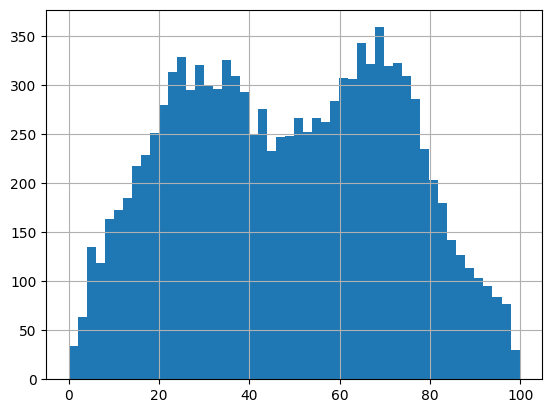

In [58]:
lac_level_2_gpd["POVERTY_RATE"].hist(bins=50)

<Axes: >

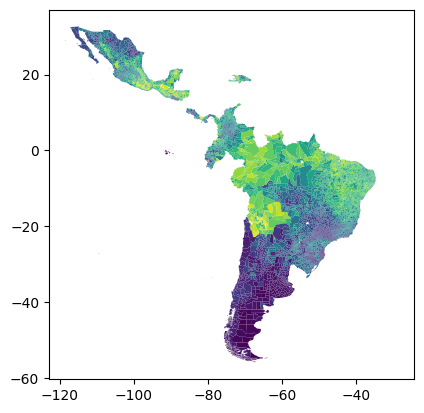

In [59]:
lac_level_2_gpd.plot("POVERTY_RATE")

In [60]:
amazonia_poverty_level_2_gpd = lac_level_2_gpd[
    lac_level_2_gpd.intersects(amazonas_limits.iloc[0].geometry)
]

In [61]:
amazonia_poverty_level_2_gpd.to_parquet("outputs/amazonia_poverty_level_2_gpd.parquet")

### The Relative Wealth Index

Rredicts the relative standard of living within countries using de-identified connectivity data, satellite imagery and other nontraditional data sources. The data is provided for 93 low and middle-income countries at 2.4km resolution.

> Microestimates of wealth for all low- and middle-income countries Guanghua Chi, Han Fang, Sourav Chatterjee, Joshua E. Blumenstock Proceedings of the National Academy of Sciences Jan 2022, 119 (3) e2113658119; DOI: 10.1073/pnas.2113658119


In [62]:
peru_relative_wealth_index = pd.read_csv("~/Downloads/per_relative_wealth_index.csv")
peru_relative_wealth_index_gpd = gpd.GeoDataFrame(
    peru_relative_wealth_index,
    geometry=gpd.points_from_xy(
        peru_relative_wealth_index["longitude"], peru_relative_wealth_index["latitude"]
    ),
    crs=4326,
)

In [63]:
# Create a cell of 2.4km x 2.4km for each point
peru_relative_wealth_index_proj = ox.project_gdf(peru_relative_wealth_index_gpd)
peru_rwi_grid_proj = peru_relative_wealth_index_proj.geometry.buffer(2400 / 2).envelope
peru_rwi_grid = peru_rwi_grid_proj.to_crs(4326)
peru_relative_wealth_index_gpd.geometry = peru_rwi_grid

In [64]:
if False:
    peru_relative_wealth_index_gpd.explore("rwi")

Text(0.5, 1.0, 'Amazonian Region & Cartographic Boundaries level 2')

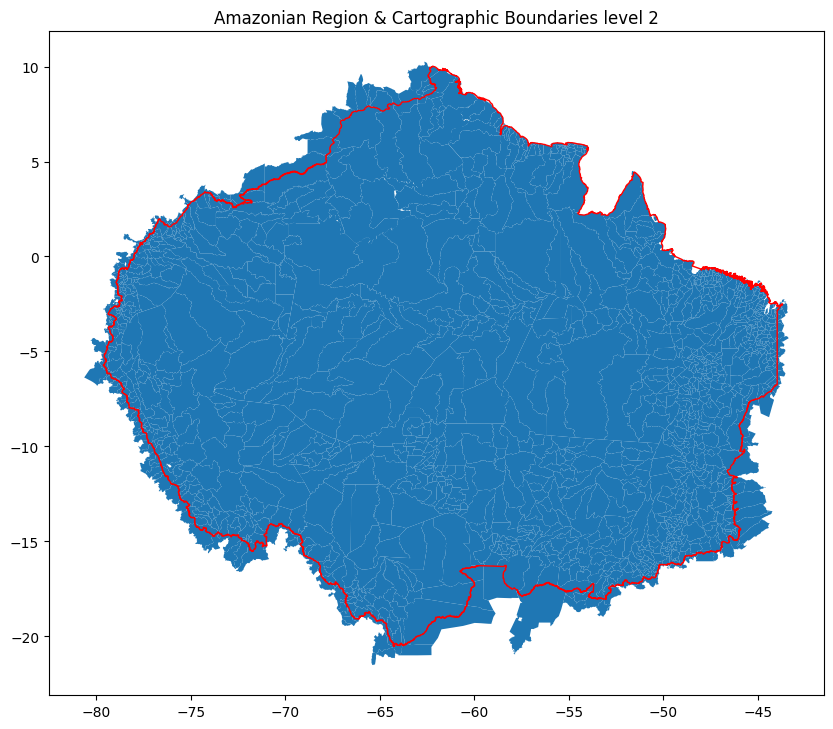

In [65]:
ax = amazonia_poverty_level_2_gpd.plot(figsize=(10, 10))
amazonas_limits.plot(ax=ax, edgecolor="red", facecolor="none")
plt.title("Amazonian Region & Cartographic Boundaries level 2")

<Axes: >

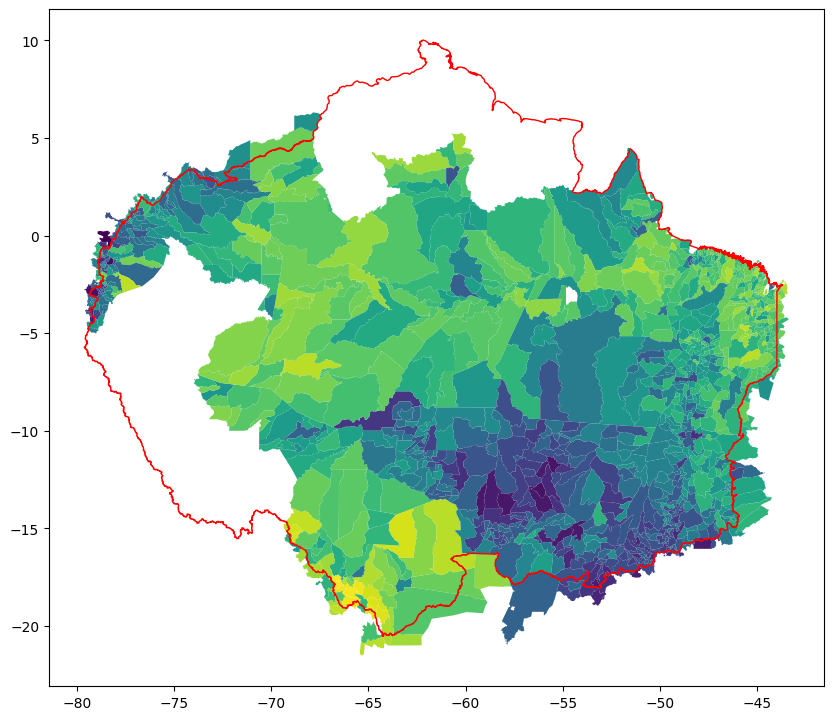

In [66]:
ax = amazonia_poverty_level_2_gpd.plot("POVERTY_RATE", figsize=(10, 10))
amazonas_limits.plot(ax=ax, edgecolor="red", facecolor="none")

In [67]:
amazonia_poverty_level_2_gpd.columns

Index(['ADM0_EN', 'ADM0_PCODE', 'ADM1_EN', 'ADM1_PCODE', 'ADM2_EN',
       'ADM2_PCODE', 'geometry', 'POVERTY_RATE', 'POVERTY_NUM', 'NBI_RATE',
       'NBI_NUM', 'POVERTY_RATE_TOT', 'POVERTY_NUM_TOT', 'POVERTY_SOURCE'],
      dtype='object')

<Axes: >

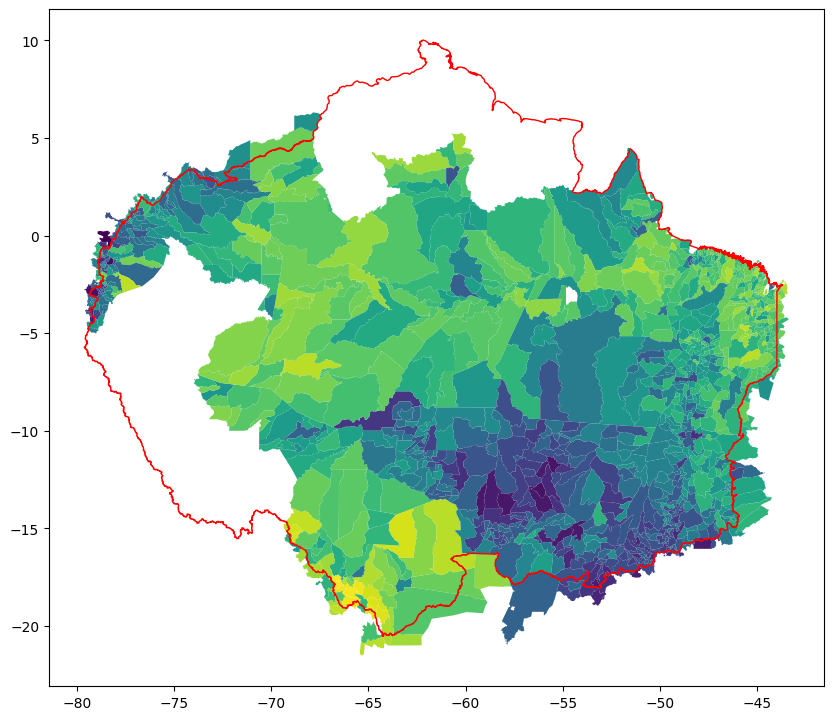

In [68]:
ax = amazonia_poverty_level_2_gpd.plot("POVERTY_RATE", figsize=(10, 10))
amazonas_limits.plot(ax=ax, edgecolor="red", facecolor="none")

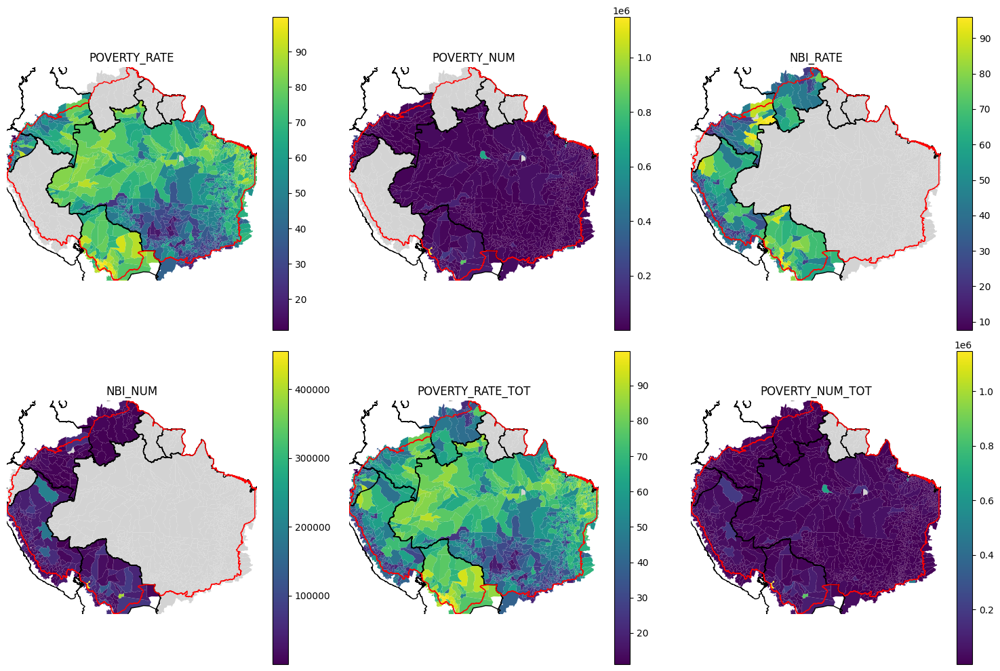

In [69]:
# Create a subplot with 2 rows and 3 columns
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

# Variables to plot
variables = [
    "POVERTY_RATE",
    "POVERTY_NUM",
    "NBI_RATE",
    "NBI_NUM",
    "POVERTY_RATE_TOT",
    "POVERTY_NUM_TOT",
]

# Iterate over the variables and plot each one
for i, variable in enumerate(variables):
    # Get the axis for the current subplot
    ax = axs[i // 3, i % 3]

    # Plot the variable on the map
    amazonia_poverty_level_2_gpd.plot(
        column=variable,
        linewidth=0.8,
        ax=ax,
        legend=True,
        edgecolor="none",
        missing_kwds={"color": "lightgray"},
    )
    amzn_countries.plot(ax=ax, edgecolor="black", facecolor="none")
    amazonas_limits.plot(ax=ax, edgecolor="red", facecolor="none")

    # Set the title for the subplot
    ax.set_title(variable)

    # Set the axis limits
    minx, miny, maxx, maxy = amazonas_limits.total_bounds
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)

    # Remove the axis labels
    ax.set_axis_off()

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

<Axes: >

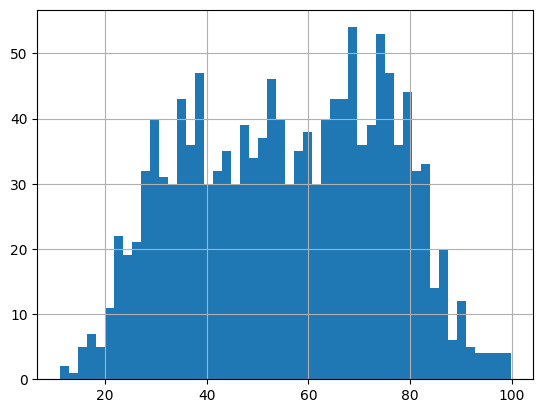

In [70]:
amazonia_poverty_level_2_gpd["POVERTY_RATE_TOT"].hist(bins=50)

In [71]:
# amazonia_poverty_level_2_gpd["POVERTY_RATE_TOT"].describe(
#     percentiles=[0.1, 0.25, 0.5, 0.75, 0.9]
# )

For visualization and analysis, we will categorize this variable in quartiles, where the first quartile represents the poorest areas and the fourth quartile the richest areas.


In [72]:
# cuts = (
#     amazonia_poverty_level_2_gpd["POVERTY_RATE_TOT"]
#     .quantile([0.1, 0.25, 0.5, 0.75, 0.9])
#     .values.tolist()
# )
# cuts = [0] + cuts + [100]
# cuts

# cuts = [0, 33, 66, 100]
cuts = [0, 20, 40, 60, 80, 100]

In [73]:
amazonia_poverty_level_2_gpd = amazonia_poverty_level_2_gpd.assign(
    POVERTY_RATE_TOT_CAT=pd.cut(amazonia_poverty_level_2_gpd["POVERTY_RATE_TOT"], cuts)
)

In [74]:
amazonia_poverty_level_2_gpd["POVERTY_RATE_TOT_CAT"].value_counts(normalize=True).round(
    2
).sort_index()

POVERTY_RATE_TOT_CAT
(0, 20]      0.01
(20, 40]     0.25
(40, 60]     0.29
(60, 80]     0.34
(80, 100]    0.10
Name: proportion, dtype: float64

<Axes: >

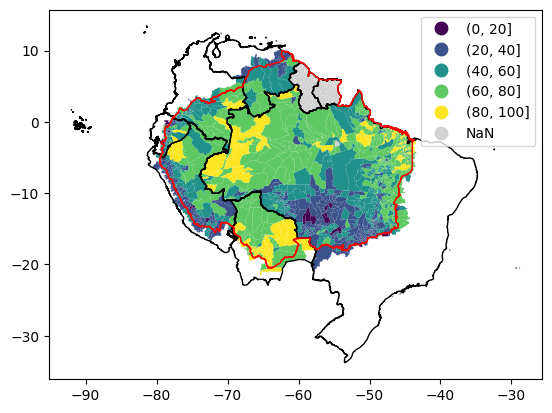

In [75]:
# Plot the variable on the map
ax = amazonia_poverty_level_2_gpd.plot(
    column="POVERTY_RATE_TOT_CAT",
    linewidth=0.8,
    legend=True,
    edgecolor="none",
    cmap="viridis",
    missing_kwds={"color": "lightgray"},
)
amzn_countries.plot(ax=ax, edgecolor="black", facecolor="none")
amazonas_limits.plot(ax=ax, edgecolor="red", facecolor="none")

In [76]:
amazonia_poverty_level_2_gpd["POVERTY_RATE_TOT_CAT"].unique()

[(80.0, 100.0], (60.0, 80.0], (40.0, 60.0], NaN, (20.0, 40.0], (0.0, 20.0]]
Categories (5, interval[int64, right]): [(0, 20] < (20, 40] < (40, 60] < (60, 80] < (80, 100]]

In [77]:
amazonia_complete_hexs["poverty_rate_cat"] = np.nan

In [78]:
# Elimina nans
amazonia_poverty_level_2_gpd_clean = amazonia_poverty_level_2_gpd[
    amazonia_poverty_level_2_gpd["POVERTY_RATE_TOT_CAT"].notna()
]

<Axes: >

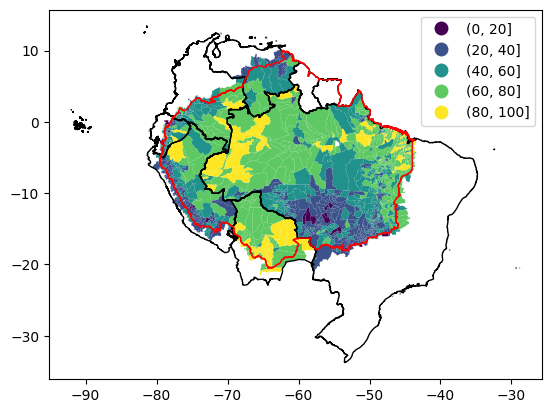

In [79]:
# Plot the variable on the map
ax = amazonia_poverty_level_2_gpd_clean.plot(
    column="POVERTY_RATE_TOT_CAT",
    linewidth=0.8,
    legend=True,
    edgecolor="none",
    cmap="viridis",
    missing_kwds={"color": "lightgray"},
)
amzn_countries.plot(ax=ax, edgecolor="black", facecolor="none")
amazonas_limits.plot(ax=ax, edgecolor="red", facecolor="none")

In [80]:
for poverty_cat in amazonia_poverty_level_2_gpd["POVERTY_RATE_TOT_CAT"].unique():
    if poverty_cat is not np.nan:
        print("Processing poverty category:", poverty_cat)
        # Filter hexagons with np.nan in the poverty_rate_cat column
        not_complete_hexs = amazonia_complete_hexs[
            amazonia_complete_hexs["poverty_rate_cat"].isna()
        ]
        # Filter hexagons that are within the poverty category
        current_poverty_level = amazonia_poverty_level_2_gpd[
            amazonia_poverty_level_2_gpd["POVERTY_RATE_TOT_CAT"] == poverty_cat
        ]
        intersected_hexs = not_complete_hexs.parallel_apply(
            lambda x: current_poverty_level.intersects(x.geometry).any(), axis=1
        )
        # Assign the poverty category to the filtered hexagons
        selected_hexs = amazonia_complete_hexs["hex"].isin(
            not_complete_hexs[intersected_hexs]["hex"]
        )
        amazonia_complete_hexs.loc[selected_hexs, "poverty_rate_cat"] = poverty_cat

Processing poverty category: (80.0, 100.0]


Processing poverty category: (60.0, 80.0]


/var/folders/2v/rfkdf8zd7yx_k7lff_2bchrr0000gn/T/ipykernel_55973/1430747208.py:19: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '(80.0, 100.0]' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  amazonia_complete_hexs.loc[selected_hexs, "poverty_rate_cat"] = poverty_cat


Processing poverty category: (40.0, 60.0]


Processing poverty category: (20.0, 40.0]


Processing poverty category: (0.0, 20.0]


<Axes: title={'center': 'Aggregated in Hexagons'}>

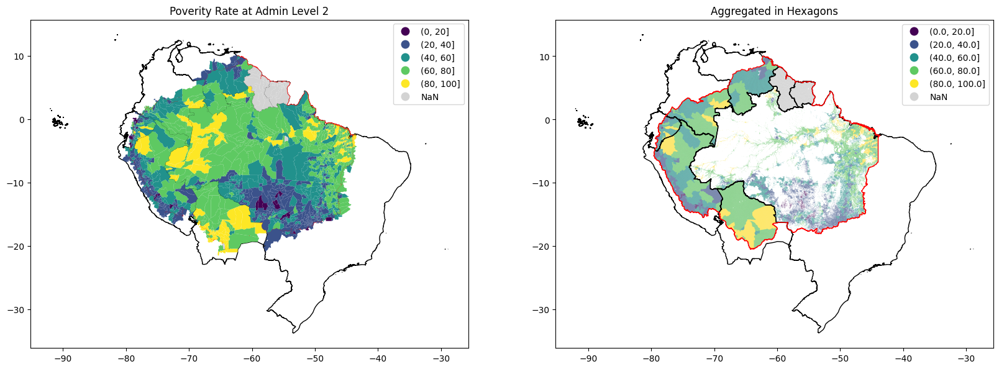

In [81]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Plot the hexs on the map
amazonia_complete_hexs.plot(
    column="poverty_rate_cat",
    linewidth=0.8,
    legend=True,
    edgecolor="none",
    cmap="viridis",
    missing_kwds={"color": "lightgray"},
    ax=axes[1],
)
axes[1].set_title("Aggregated in Hexagons")
amzn_countries.plot(edgecolor="black", facecolor="none", ax=axes[0])
amazonas_limits.plot(edgecolor="red", facecolor="none", ax=axes[0])

# Plot the adm regions on the map
amazonia_poverty_level_2_gpd.plot(
    column="POVERTY_RATE_TOT_CAT",
    linewidth=0.8,
    legend=True,
    edgecolor="none",
    cmap="viridis",
    missing_kwds={"color": "lightgray"},
    ax=axes[0],
)
axes[0].set_title("Poverity Rate at Admin Level 2")
amzn_countries.plot(edgecolor="black", facecolor="none", ax=axes[1])
amazonas_limits.plot(edgecolor="red", facecolor="none", ax=axes[1])

In [82]:
amazonia_complete_hexs[
    amazonia_complete_hexs["country"].isin(["guy", "sur"])
    & amazonia_complete_hexs["poverty_rate_cat"].notna()
]["country"].value_counts()

country
guy    565
sur    109
Name: count, dtype: int64

In [83]:
amazonia_complete_hexs.shape[0]

796969

<Axes: >

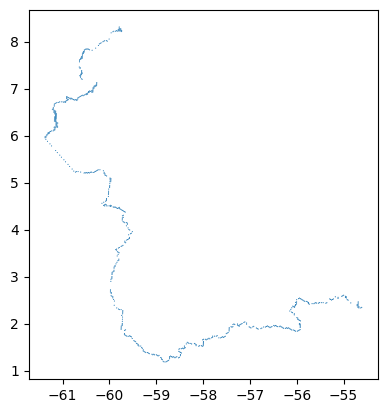

In [84]:
amazonia_complete_hexs[
    amazonia_complete_hexs["country"].isin(["guy", "sur"])
    & amazonia_complete_hexs["poverty_rate_cat"].notna()
].plot()

In [85]:
amazonia_complete_hexs[
    amazonia_complete_hexs["country"].isin(["guy", "sur"])
    & amazonia_complete_hexs["poverty_rate_cat"].notna()
]["country"].value_counts() / amazonia_complete_hexs.shape[0]

country
guy    0.000709
sur    0.000137
Name: count, dtype: float64

<Axes: >

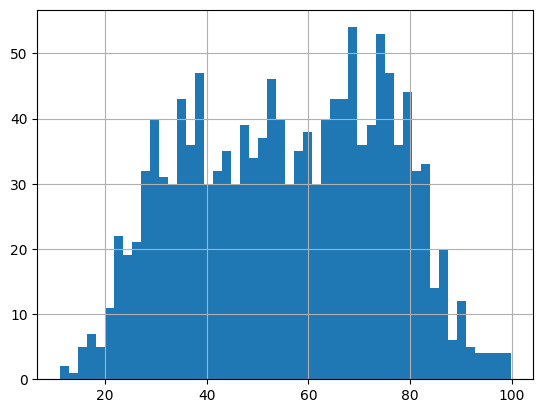

In [86]:
amazonia_poverty_level_2_gpd["POVERTY_RATE_TOT"].hist(bins=50)

In [87]:
amazonia_complete_hexs.shape

(796969, 17)

In [88]:
amazonia_complete_hexs.columns

Index(['country', 'hex', 'pob_primaria', 'pob_secundaria',
       'closest_primary_school_id', 'closest_primary_school_dist',
       'closest_secondary_school_id', 'closest_secondary_school_dist', 'lat',
       'lon', 'geometry', 'closest_primary_school_dist_cat',
       'closest_secondary_school_dist_cat',
       'closest_primary_school_dist_clipped', 'territorio_indigena',
       'protected_area', 'poverty_rate_cat'],
      dtype='object')

In [89]:
amazonia_complete_hexs["closest_primary_school_dist"].describe()

count    796969.000000
mean         23.534847
std          29.590806
min           0.003744
25%           5.336756
50%          13.229171
75%          29.417348
max         375.971383
Name: closest_primary_school_dist, dtype: float64

In [90]:
# Create a binary variable for the closest primary school distance less than 2.5km
amazonia_complete_hexs["primary_school_dist_less_2_5km"] = (
    amazonia_complete_hexs["closest_primary_school_dist"] <= 2.5
)
amazonia_complete_hexs["secondary_school_dist_less_2_5km"] = (
    amazonia_complete_hexs["closest_secondary_school_dist"] <= 2.5
)

In [91]:
amazonia_complete_hexs.columns

Index(['country', 'hex', 'pob_primaria', 'pob_secundaria',
       'closest_primary_school_id', 'closest_primary_school_dist',
       'closest_secondary_school_id', 'closest_secondary_school_dist', 'lat',
       'lon', 'geometry', 'closest_primary_school_dist_cat',
       'closest_secondary_school_dist_cat',
       'closest_primary_school_dist_clipped', 'territorio_indigena',
       'protected_area', 'poverty_rate_cat', 'primary_school_dist_less_2_5km',
       'secondary_school_dist_less_2_5km'],
      dtype='object')

In [92]:
amazonia_complete_hexs[(amazonia_complete_hexs["country"] == "per")][
    "poverty_rate_cat"
].value_counts().sort_index()

/var/folders/2v/rfkdf8zd7yx_k7lff_2bchrr0000gn/T/ipykernel_55973/1190248541.py:3: FutureWarning: The behavior of value_counts with object-dtype is deprecated. In a future version, this will *not* perform dtype inference on the resulting index. To retain the old behavior, use `result.index = result.index.infer_objects()`
  ].value_counts().sort_index()


poverty_rate_cat
(0.0, 20.0]       1073
(20.0, 40.0]     32855
(40.0, 60.0]     52539
(60.0, 80.0]     65557
(80.0, 100.0]    11488
Name: count, dtype: int64

In [93]:
amazonia_complete_hexs[(amazonia_complete_hexs["country"] == "col")][
    "poverty_rate_cat"
].value_counts().sort_index()

/var/folders/2v/rfkdf8zd7yx_k7lff_2bchrr0000gn/T/ipykernel_55973/261801669.py:3: FutureWarning: The behavior of value_counts with object-dtype is deprecated. In a future version, this will *not* perform dtype inference on the resulting index. To retain the old behavior, use `result.index = result.index.infer_objects()`
  ].value_counts().sort_index()


poverty_rate_cat
(20.0, 40.0]      1291
(40.0, 60.0]     28221
(60.0, 80.0]     46712
(80.0, 100.0]    12127
Name: count, dtype: int64

<Axes: >

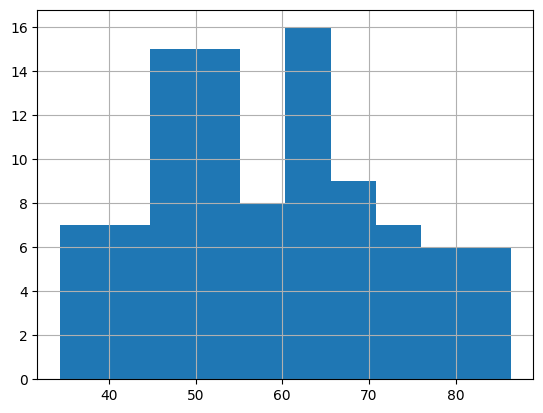

In [94]:
amazonia_poverty_level_2_gpd[amazonia_poverty_level_2_gpd.ADM0_PCODE == "COL"][
    "POVERTY_RATE_TOT"
].hist()

In [95]:
amazonia_poverty_level_2_gpd[amazonia_poverty_level_2_gpd.ADM0_PCODE == "COL"][
    "POVERTY_RATE_TOT"
].describe()

count    96.000000
mean     58.376692
std      13.241036
min      34.360083
25%      47.927976
50%      57.249067
75%      68.110848
max      86.381571
Name: POVERTY_RATE_TOT, dtype: float64

<Axes: >

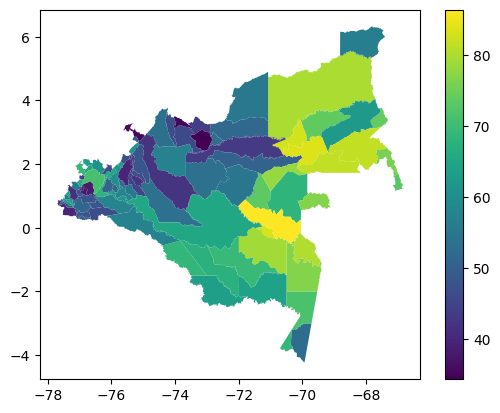

In [96]:
amazonia_poverty_level_2_gpd[amazonia_poverty_level_2_gpd.ADM0_PCODE == "COL"].plot(
    "POVERTY_RATE_TOT", legend=True
)

In [97]:
amazonia_complete_hexs.columns

Index(['country', 'hex', 'pob_primaria', 'pob_secundaria',
       'closest_primary_school_id', 'closest_primary_school_dist',
       'closest_secondary_school_id', 'closest_secondary_school_dist', 'lat',
       'lon', 'geometry', 'closest_primary_school_dist_cat',
       'closest_secondary_school_dist_cat',
       'closest_primary_school_dist_clipped', 'territorio_indigena',
       'protected_area', 'poverty_rate_cat', 'primary_school_dist_less_2_5km',
       'secondary_school_dist_less_2_5km'],
      dtype='object')

<Figure size 1400x700 with 0 Axes>

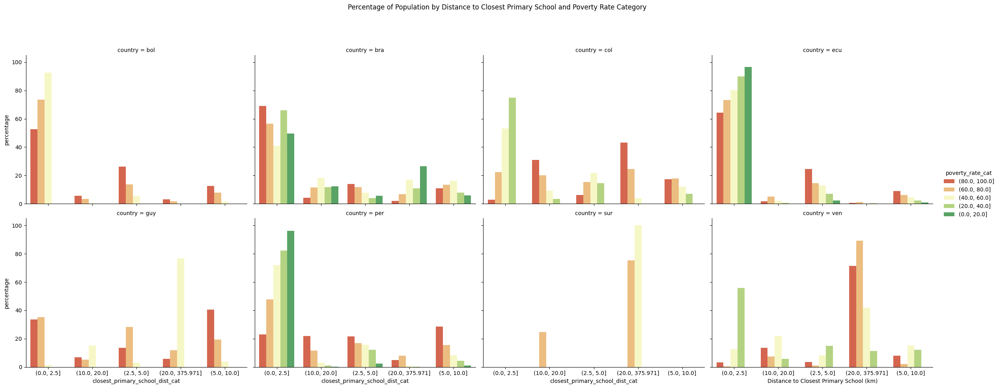

In [98]:
# Calculate the population within 2.5km of the closest primary school
pop_primaria_by_duration_country_poverty = (
    amazonia_complete_hexs.groupby(
        ["country", "poverty_rate_cat", "closest_primary_school_dist_cat"]
    )["pob_primaria"]
    .sum()
    .reset_index()
)

# Calculate the total population by country and poverty category
total_population = (
    pop_primaria_by_duration_country_poverty.groupby(["country", "poverty_rate_cat"])[
        "pob_primaria"
    ]
    .sum()
    .reset_index()
)

# Merge the total population back to the original dataframe
df = pop_primaria_by_duration_country_poverty.merge(
    total_population, on=["country", "poverty_rate_cat"], suffixes=("", "_total")
)

# Calculate the percentage of population in each distance category
df["percentage"] = (df["pob_primaria"] / df["pob_primaria_total"]) * 100

# Create the plot
plt.figure(figsize=(14, 7))
sns.catplot(
    data=df,
    x="closest_primary_school_dist_cat",
    y="percentage",
    hue="poverty_rate_cat",
    col="country",
    kind="bar",
    height=5,
    aspect=1.2,
    hue_order=df["poverty_rate_cat"].sort_values(ascending=False).unique(),
    col_wrap=4,
    palette=sns.color_palette("RdYlGn", len(df["poverty_rate_cat"].unique())),
)

# Adjust the labels and titles
plt.subplots_adjust(top=0.85)

plt.suptitle(
    "Percentage of Population by Distance to Closest Primary School and Poverty Rate Category"
)

plt.xlabel("Distance to Closest Primary School (km)")
plt.ylabel("Percentage of Primary School Population")

# Save the plot
plt.savefig(
    "outputs/pop_primaria_by_school_dist_country_poverty.png",
    dpi=300,
    bbox_inches="tight",
    format="png",
)

plt.savefig(
    "outputs/pop_primaria_by_school_dist_country_poverty.svg",
    dpi=300,
    bbox_inches="tight",
    format="svg",
)

# Show the plot
plt.show()

In [99]:
# Save the data
df.to_excel("outputs/pop_primaria_by_school_dist_country_poverty.xlsx")

<Figure size 1400x700 with 0 Axes>

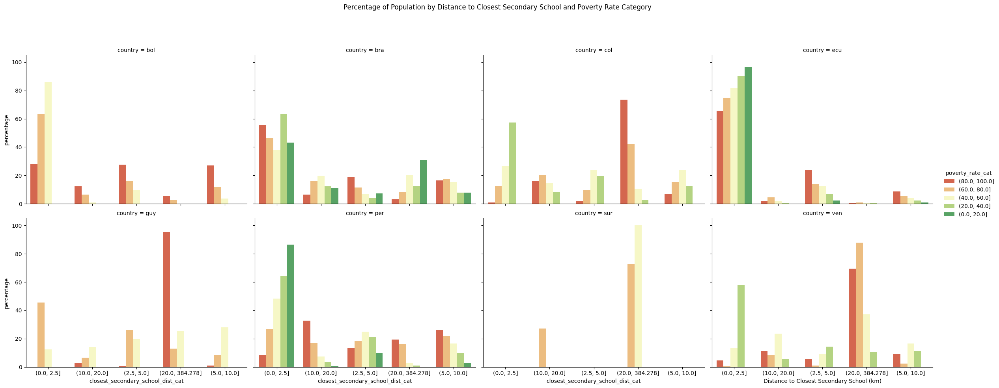

In [100]:
# Calculate the population within 2.5km of the closest secondary school
pop_secundaria_by_duration_country_poverty = (
    amazonia_complete_hexs.groupby(
        ["country", "poverty_rate_cat", "closest_secondary_school_dist_cat"]
    )["pob_secundaria"]
    .sum()
    .reset_index()
)

# Calculate the total population by country and poverty category
total_population = (
    pop_secundaria_by_duration_country_poverty.groupby(["country", "poverty_rate_cat"])[
        "pob_secundaria"
    ]
    .sum()
    .reset_index()
)

# Merge the total population back to the original dataframe
df = pop_secundaria_by_duration_country_poverty.merge(
    total_population, on=["country", "poverty_rate_cat"], suffixes=("", "_total")
)

# Calculate the percentage of population in each distance category
df["percentage"] = (df["pob_secundaria"] / df["pob_secundaria_total"]) * 100

# Create the plot
plt.figure(figsize=(14, 7))
sns.catplot(
    data=df,
    x="closest_secondary_school_dist_cat",
    y="percentage",
    hue="poverty_rate_cat",
    col="country",
    kind="bar",
    height=5,
    aspect=1.2,
    hue_order=df["poverty_rate_cat"].sort_values(ascending=False).unique(),
    col_wrap=4,
    palette=sns.color_palette("RdYlGn", len(df["poverty_rate_cat"].unique())),
)

# Adjust the labels and titles
plt.subplots_adjust(top=0.85)

plt.suptitle(
    "Percentage of Population by Distance to Closest Secondary School and Poverty Rate Category"
)

plt.xlabel("Distance to Closest Secondary School (km)")
plt.ylabel("Percentage of Secondary School Population")

# Save the plot
plt.savefig(
    "outputs/pop_secundaria_by_school_dist_country_poverty.png",
    dpi=300,
    bbox_inches="tight",
    format="png",
)

plt.savefig(
    "outputs/pop_secundaria_by_school_dist_country_poverty.svg",
    dpi=300,
    bbox_inches="tight",
    format="svg",
)

# Show the plot
plt.show()

In [101]:
# Save the data
df.to_excel("outputs/pop_secundaria_by_school_dist_country_poverty.xlsx")

<Figure size 1400x700 with 0 Axes>

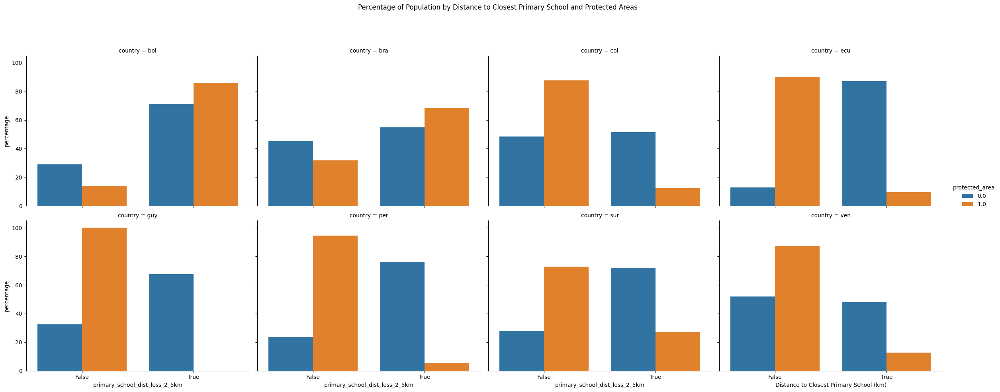

In [102]:
# Calculate the population within 2.5km of the closest primary school
pop_primaria_by_duration_country_protected_areas = (
    amazonia_complete_hexs.groupby(
        ["country", "protected_area", "primary_school_dist_less_2_5km"]
    )["pob_primaria"]
    .sum()
    .reset_index()
)

# Calculate the total population by country and protected area
total_population = (
    pop_primaria_by_duration_country_protected_areas.groupby(
        ["country", "protected_area"]
    )["pob_primaria"]
    .sum()
    .reset_index()
)

# Merge the total population back to the original dataframe
df = pop_primaria_by_duration_country_protected_areas.merge(
    total_population, on=["country", "protected_area"], suffixes=("", "_total")
)

# Calculate the percentage of population in each distance category
df["percentage"] = (df["pob_primaria"] / df["pob_primaria_total"]) * 100

# Create the plot
plt.figure(figsize=(14, 7))
sns.catplot(
    data=df,
    x="primary_school_dist_less_2_5km",
    y="percentage",
    hue="protected_area",
    col="country",
    kind="bar",
    height=5,
    aspect=1.2,
    col_wrap=4,
)

# Adjust the labels and titles
plt.subplots_adjust(top=0.85)

plt.suptitle(
    "Percentage of Population by Distance to Closest Primary School and Protected Areas"
)

plt.xlabel("Distance to Closest Primary School (km)")
plt.ylabel("Percentage of Primary School Population")

# Save the plot
plt.savefig(
    "outputs/pop_primaria_by_school_dist_2_5_km_country_protected_areas.png",
    dpi=300,
    bbox_inches="tight",
    format="png",
)

plt.savefig(
    "outputs/pop_primaria_by_school_dist_2_5_km_country_protected_areas.svg",
    dpi=300,
    bbox_inches="tight",
    format="svg",
)

# Show the plot
plt.show()

In [103]:
# Save the data
df.to_excel("outputs/pop_primaria_by_school_dist_2_5_km_country_protected_areas.xlsx")

<Figure size 1400x700 with 0 Axes>

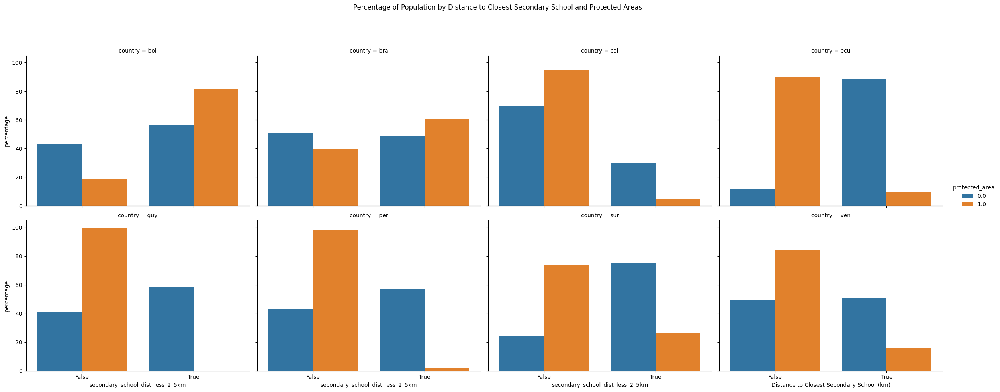

In [104]:
# Calculate the population within 2.5km of the closest primary school
pop_secundaria_by_duration_country_protected_areas = (
    amazonia_complete_hexs.groupby(
        ["country", "protected_area", "secondary_school_dist_less_2_5km"]
    )["pob_secundaria"]
    .sum()
    .reset_index()
)

# Calculate the total population by country and poverty category
total_population = (
    pop_secundaria_by_duration_country_protected_areas.groupby(
        ["country", "protected_area"]
    )["pob_secundaria"]
    .sum()
    .reset_index()
)

# Merge the total population back to the original dataframe
df = pop_secundaria_by_duration_country_protected_areas.merge(
    total_population, on=["country", "protected_area"], suffixes=("", "_total")
)

# Calculate the percentage of population in each distance category
df["percentage"] = (df["pob_secundaria"] / df["pob_secundaria_total"]) * 100

# Create the plot
plt.figure(figsize=(14, 7))
sns.catplot(
    data=df,
    x="secondary_school_dist_less_2_5km",
    y="percentage",
    hue="protected_area",
    col="country",
    kind="bar",
    height=5,
    aspect=1.2,
    col_wrap=4,
)

# Adjust the labels and titles
plt.subplots_adjust(top=0.85)

plt.suptitle(
    "Percentage of Population by Distance to Closest Secondary School and Protected Areas"
)

plt.xlabel("Distance to Closest Secondary School (km)")
plt.ylabel("Percentage of Secondary School Population")

# Save the plot
plt.savefig(
    "outputs/pop_secundaria_by_school_dist_2_5_km_country_protected_areas.png",
    dpi=300,
    bbox_inches="tight",
    format="png",
)

plt.savefig(
    "outputs/pop_secundaria_by_school_dist_2_5_km_country_protected_areas.svg",
    dpi=300,
    bbox_inches="tight",
    format="svg",
)

# Show the plot
plt.show()

In [105]:
# Save the data
df.to_excel("outputs/pop_secundaria_by_duration_country_protected_areas.xlsx")

Distance to closest primary school categories distribution
                                  count  percentage
closest_primary_school_dist_cat                    
(0.0, 2.5]                        89138   11.184626
(10.0, 20.0]                     174521   21.898091
(2.5, 5.0]                        98590   12.370619
(20.0, 375.971]                  292373   36.685618
(5.0, 10.0]                      142347   17.861046 

Distance to closest secondary school categories distribution
                                    count  percentage
closest_secondary_school_dist_cat                    
(0.0, 2.5]                          46301    5.809636
(10.0, 20.0]                       180761   22.681058
(2.5, 5.0]                          74972    9.407141
(20.0, 384.278]                    359330   45.087074
(5.0, 10.0]                        135605   17.015091 



/var/folders/2v/rfkdf8zd7yx_k7lff_2bchrr0000gn/T/ipykernel_55973/1235130867.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(
/var/folders/2v/rfkdf8zd7yx_k7lff_2bchrr0000gn/T/ipykernel_55973/1235130867.py:58: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(


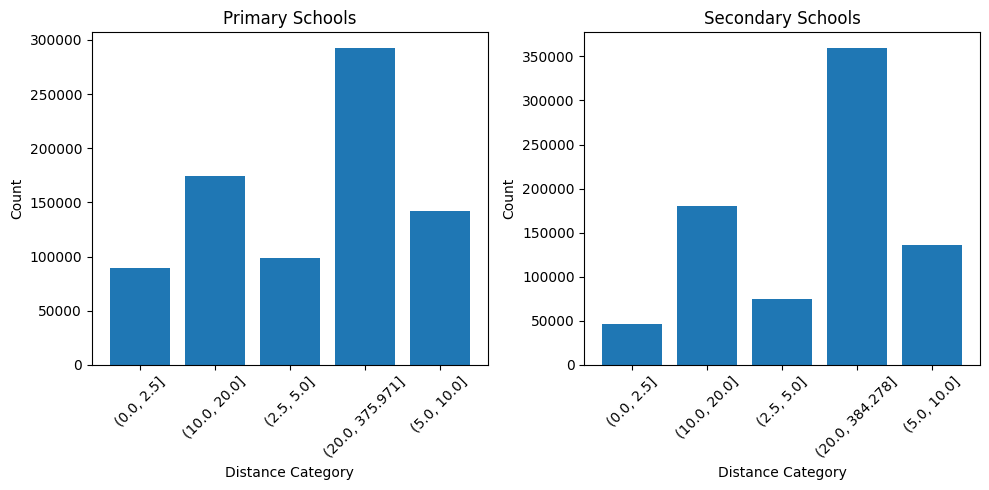

In [106]:
print("Distance to closest primary school categories distribution")
value_counts = (
    amazonia_complete_hexs["closest_primary_school_dist_cat"].value_counts().to_frame()
)
# Add normalized value counts
value_counts["percentage"] = (
    amazonia_complete_hexs["closest_primary_school_dist_cat"].value_counts(
        normalize=True
    )
    * 100
)
value_counts = value_counts.sort_index()
print(value_counts, "\n")

print("Distance to closest secondary school categories distribution")
value_counts = (
    amazonia_complete_hexs["closest_secondary_school_dist_cat"]
    .value_counts()
    .to_frame()
)
# Add normalized value counts
value_counts["percentage"] = (
    amazonia_complete_hexs["closest_secondary_school_dist_cat"].value_counts(
        normalize=True
    )
    * 100
)
value_counts = value_counts.sort_index()
print(value_counts, "\n")

# Create a figure with 2 subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the distance to closest primary school categories distribution
value_counts = (
    amazonia_complete_hexs["closest_primary_school_dist_cat"]
    .value_counts()
    .sort_index()
)
axes[0].bar(value_counts.index, value_counts.values)
axes[0].set_xlabel("Distance Category")
axes[0].set_ylabel("Count")
axes[0].set_title("Primary Schools")
axes[0].set_xticklabels(
    value_counts.index, rotation=45
)  # Rotate the x-axis tick labels

# Plot the distance to closest secondary school categories distribution
value_counts = (
    amazonia_complete_hexs["closest_secondary_school_dist_cat"]
    .value_counts()
    .sort_index()
)
axes[1].bar(value_counts.index, value_counts.values)
axes[1].set_xlabel("Distance Category")
axes[1].set_ylabel("Count")
axes[1].set_title("Secondary Schools")
axes[1].set_xticklabels(
    value_counts.index, rotation=45
)  # Rotate the x-axis tick labels

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

In [107]:
import xycmap

In [108]:
amazonia_complete_downsampled_hexs_5 = up.geom.resolution_downsampling(
    amazonia_complete_hexs[
        (amazonia_complete_hexs["pob_primaria"] > 1)
        | (amazonia_complete_hexs["pob_secundaria"] > 1)
    ],
    hex_col="hex",
    coarse_resolution=5,
    # Aggregate the color values by taking the mode because the colors are categorical
    agg={
        "poverty_rate_cat": lambda x: x.mode()[0] if len(x.mode()) > 0 else np.nan,
        "closest_primary_school_dist": "mean",
        "closest_secondary_school_dist": "mean",
    },
)

In [109]:
primary_custom_bins = [
    0,
    2.5,
    5,
    10,
    20,
    amazonia_complete_hexs["closest_primary_school_dist"].max(),
]
primary_custom_bins

[0, 2.5, 5, 10, 20, 375.9713829481223]

In [110]:
amazonia_complete_downsampled_hexs_5["closest_primary_school_dist_cat"] = pd.cut(
    amazonia_complete_downsampled_hexs_5["closest_primary_school_dist"],
    bins=primary_custom_bins,
)
amazonia_complete_downsampled_hexs_5["closest_primary_school_dist_cat"].unique()

[(20.0, 375.971], (10.0, 20.0], (5.0, 10.0], (2.5, 5.0], (0.0, 2.5]]
Categories (5, interval[float64, right]): [(0.0, 2.5] < (2.5, 5.0] < (5.0, 10.0] < (10.0, 20.0] < (20.0, 375.971]]

In [111]:
amazonia_complete_downsampled_hexs_5["closest_primary_school_dist_label"] = (
    amazonia_complete_downsampled_hexs_5["closest_primary_school_dist_cat"]
    .astype(str)
    .replace(
        {
            "(0.0, 2.5]": "<2.5",
            "(2.5, 5.0]": "2.5-5",
            "(5.0, 10.0]": "5-10",
            "(10.0, 20.0]": "10-20",
            "(20.0, 375.971]": ">20",
        }
    )
)

In [112]:
secondary_custom_bins = [
    0,
    2.5,
    5,
    10,
    20,
    amazonia_complete_hexs["closest_secondary_school_dist"].max(),
]
secondary_custom_bins

[0, 2.5, 5, 10, 20, 384.2783441605675]

In [113]:
amazonia_complete_downsampled_hexs_5["closest_secondary_school_dist_cat"] = pd.cut(
    amazonia_complete_downsampled_hexs_5["closest_secondary_school_dist"],
    bins=secondary_custom_bins,
)
amazonia_complete_downsampled_hexs_5["closest_secondary_school_dist_cat"].unique()

[(20.0, 384.278], (10.0, 20.0], (5.0, 10.0], (2.5, 5.0], (0.0, 2.5]]
Categories (5, interval[float64, right]): [(0.0, 2.5] < (2.5, 5.0] < (5.0, 10.0] < (10.0, 20.0] < (20.0, 384.278]]

In [114]:
amazonia_complete_downsampled_hexs_5["closest_secondary_school_dist_label"] = (
    amazonia_complete_downsampled_hexs_5["closest_secondary_school_dist_cat"]
    .astype(str)
    .replace(
        {
            "(0.0, 2.5]": "<2.5",
            "(2.5, 5.0]": "2.5-5",
            "(5.0, 10.0]": "5-10",
            "(10.0, 20.0]": "10-20",
            "(20.0, 384.278]": ">20",
        }
    )
)

In [115]:
amazonia_complete_downsampled_hexs_5["poverty_rate_cat"].value_counts().sort_index()

poverty_rate_cat
(0.0, 20.0]       212
(20.0, 40.0]     3188
(40.0, 60.0]     5092
(60.0, 80.0]     6633
(80.0, 100.0]    2117
Name: count, dtype: int64

In [116]:
amazonia_complete_downsampled_hexs_5["poverty_rate_label"] = (
    amazonia_complete_downsampled_hexs_5["poverty_rate_cat"]
    .astype(str)
    .replace(
        {
            "(0.0, 20.0]": "<20",
            "(20.0, 40.0]": "20-40",
            "(40.0, 60.0]": "40-60",
            "(60.0, 80.0]": "60-80",
            "(80.0, 100.0]": ">80",
            "nan": np.nan,
        }
    )
)

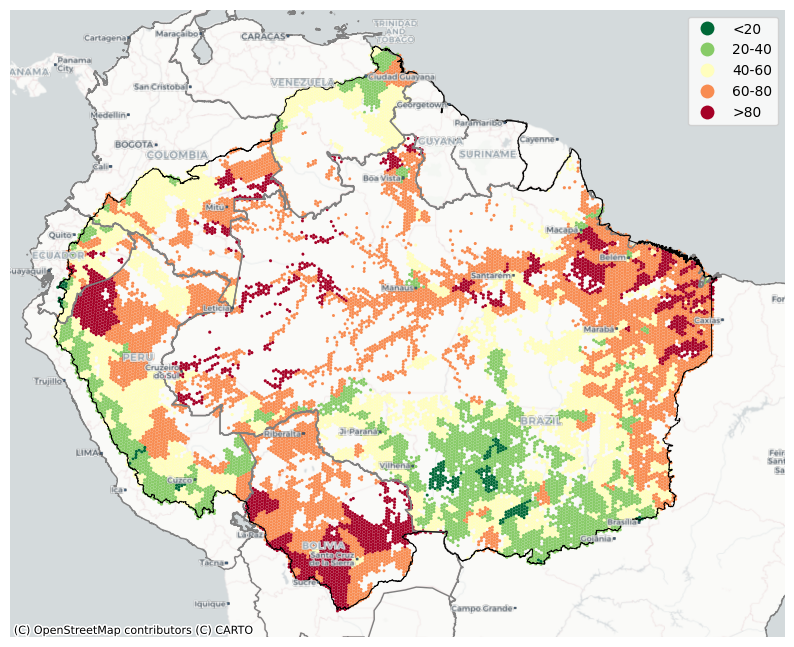

In [117]:
ax = amazonia_complete_downsampled_hexs_5.dropna(subset="poverty_rate_label").plot(
    "poverty_rate_label",
    linewidth=0,
    legend=True,
    categorical=True,
    categories=["<20", "20-40", "40-60", "60-80", ">80"],
    cmap="RdYlGn_r",
    figsize=(10, 10),
)

amzn_countries.plot(facecolor="none", edgecolor="grey", ax=ax, linewidth=1)
amazonas_limits.plot(facecolor="none", edgecolor="black", linewidth=0.7, ax=ax)

ax.set_xlim(-82, -40)
ax.set_ylim(-22, 12)

ctx.add_basemap(
    ax,
    crs=amazonia_complete_downsampled_hexs_5.crs.to_string(),
    source=ctx.providers.CartoDB.Positron,
)
ctx.add_basemap(
    ax,
    crs=amazonia_complete_downsampled_hexs_5.crs.to_string(),
    source=ctx.providers.CartoDB.PositronOnlyLabels,
)
ax.set_axis_off()

plt.savefig(
    "outputs/map_poverty_rate.png",
    dpi=300,
    bbox_inches="tight",
)
plt.savefig(
    "outputs/map_poverty_rate.svg",
    dpi=300,
    bbox_inches="tight",
)

In [118]:
amazonia_complete_downsampled_hexs_5["closest_primary_school_dist_cat"].unique()

[(20.0, 375.971], (10.0, 20.0], (5.0, 10.0], (2.5, 5.0], (0.0, 2.5]]
Categories (5, interval[float64, right]): [(0.0, 2.5] < (2.5, 5.0] < (5.0, 10.0] < (10.0, 20.0] < (20.0, 375.971]]

In [119]:
# Distance will have a color gradient from red (high) to blue (low) and Poverty rate will have a color gradient from red (high) to green (low)
dist_cmap = plt.cm.YlOrRd
pov_cmap = plt.cm.BuPu

primary_cmap = xycmap.mean_xycmap(
    xcmap=dist_cmap,
    ycmap=pov_cmap,
    n=(
        # Number of colors for the x-axis
        len(
            amazonia_complete_hexs["closest_primary_school_dist_cat"].dropna().unique()
        ),
        # Number of colors for the y-axis
        len(amazonia_complete_hexs["poverty_rate_cat"].dropna().unique()),
    ),
)

poverty_rate_categorical = pd.Categorical(
    amazonia_complete_downsampled_hexs_5["poverty_rate_cat"],
    categories=amazonia_complete_downsampled_hexs_5["poverty_rate_cat"]
    .dropna()
    .sort_values()
    .unique(),
    ordered=True,
)

primary_schools_dist_categorical = pd.Categorical(
    amazonia_complete_downsampled_hexs_5["closest_primary_school_dist_cat"],
    categories=[
        "(0.0, 2.5]",
        "(2.5, 5.0]",
        "(5.0, 10.0]",
        "(10.0, 20.0]",
        "(20.0, 375.971]",
    ],
    ordered=True,
)

primary_colors = xycmap.bivariate_color(
    sy=poverty_rate_categorical,
    sx=primary_schools_dist_categorical,
    cmap=primary_cmap,
)
amazonia_complete_downsampled_hexs_5["primary_colors"] = primary_colors

In [120]:
# Set parameters for basemaps
from secret import *

BASEMAP = ctx.providers.MapBox(
    id="mapbox/satellite-v9",
    accessToken=MAPBOX_API_KEY,
)

BASEMAP_WITH_LABELS = ctx.providers.MapBox(
    id="mapbox/satellite-streets-v12",
    accessToken=MAPBOX_API_KEY,
)

BASEMAP_WHITE = ctx.providers.MapBox(
    id="mapbox/light-v10",
    accessToken=MAPBOX_API_KEY,
)

BASEMAP_DARK = ctx.providers.MapBox(
    id="mapbox/dark-v10",
    accessToken=MAPBOX_API_KEY,
)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


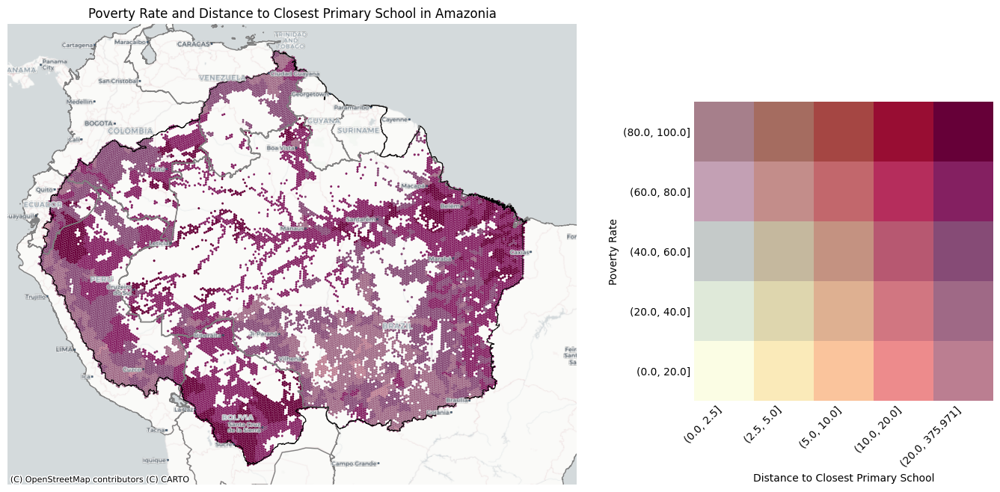

In [121]:
fig, ax = plt.subplots(figsize=(10, 8))

cax = fig.add_axes([1, 0.25, 0.5, 0.5])
cax = xycmap.bivariate_legend(
    ax=cax,
    sx=primary_schools_dist_categorical,
    sy=poverty_rate_categorical,
    cmap=primary_cmap,
)
cax.set(frame_on=False)
cax.set_xticklabels(
    primary_schools_dist_categorical.categories, rotation=45, ha="right"
)
cax.tick_params(axis="both", which="both", length=0)
cax.set_xlabel("Distance to Closest Primary School")
cax.set_ylabel("Poverty Rate")

hexs_plot = amazonia_complete_downsampled_hexs_5.dropna(
    subset=["poverty_rate_cat", "closest_primary_school_dist_cat"]
)
hexs_plot.plot(
    color=hexs_plot["primary_colors"],
    legend=True,
    figsize=(10, 10),
    ax=ax,
    cax=cax,
    linewidth=0,
)

amzn_countries.plot(facecolor="none", edgecolor="grey", ax=ax, linewidth=1)
amazonas_limits.plot(facecolor="none", edgecolor="black", linewidth=0.7, ax=ax)

ax.set_xlim(-82, -40)
ax.set_ylim(-22, 12)

ax.legend(loc="upper right", bbox_to_anchor=(1.2, 1), frameon=False)

ax.set_axis_off()
ctx.add_basemap(
    ax,
    crs=amazonia_complete_downsampled_hexs_5.crs.to_string(),
    source=ctx.providers.CartoDB.Positron,
)
ctx.add_basemap(
    ax,
    crs=amazonia_complete_downsampled_hexs_5.crs.to_string(),
    source=ctx.providers.CartoDB.PositronOnlyLabels,
)

ax.set_title("Poverty Rate and Distance to Closest Primary School in Amazonia")

plt.savefig(
    "outputs/map_poverty_rate_x_distance_to_closest_primary_school.png",
    dpi=300,
    bbox_inches="tight",
    format="png",
)

plt.savefig(
    "outputs/map_poverty_rate_x_distance_to_closest_primary_school.svg",
    dpi=300,
    bbox_inches="tight",
    format="svg",
)

plt.show()

In [122]:
## Create a crosstab between poverty rate and distance to closest primary school
crosstab_primary = pd.crosstab(
    amazonia_complete_downsampled_hexs_5["poverty_rate_cat"],
    amazonia_complete_downsampled_hexs_5["closest_primary_school_dist_cat"],
    normalize="index",
)
crosstab_primary * 100

closest_primary_school_dist_cat,"(0.0, 2.5]","(2.5, 5.0]","(5.0, 10.0]","(10.0, 20.0]","(20.0, 375.971]"
poverty_rate_cat,,,,,
"(0.0, 20.0]",6.603774,10.849057,12.264151,15.566038,54.716981
"(20.0, 40.0]",8.939774,12.484316,17.973651,22.396487,38.205772
"(40.0, 60.0]",8.228594,14.650432,21.445405,23.527101,32.148468
"(60.0, 80.0]",11.382482,19.764812,24.332881,20.337705,24.182120
"(80.0, 100.0]",19.178082,28.200283,21.776098,17.146906,13.698630


In [123]:
amazonia_complete_downsampled_hexs_5[
    "closest_secondary_school_dist_cat"
].value_counts().sort_index()

closest_secondary_school_dist_cat
(0.0, 2.5]          806
(2.5, 5.0]         2327
(5.0, 10.0]        4039
(10.0, 20.0]       4259
(20.0, 384.278]    6239
Name: count, dtype: int64

In [124]:
secondary_cmap = xycmap.mean_xycmap(
    xcmap=dist_cmap,
    ycmap=pov_cmap,
    n=(
        # Number of colors for the x-axis
        len(
            amazonia_complete_hexs["closest_secondary_school_dist_cat"]
            .dropna()
            .unique()
        ),
        # Number of colors for the y-axis
        len(amazonia_complete_hexs["poverty_rate_cat"].dropna().unique()),
    ),
)

secondary_schools_dist_cat = pd.Categorical(
    amazonia_complete_downsampled_hexs_5["closest_secondary_school_dist_cat"],
    categories=[
        "(0.0, 2.5]",
        "(2.5, 5.0]",
        "(5.0, 10.0]",
        "(10.0, 20.0]",
        "(20.0, 384.278]",
    ],
    ordered=True,
)

secondary_colors = xycmap.bivariate_color(
    sy=poverty_rate_categorical,
    sx=secondary_schools_dist_cat,
    cmap=secondary_cmap,
)
amazonia_complete_downsampled_hexs_5["secondary_colors"] = secondary_colors

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


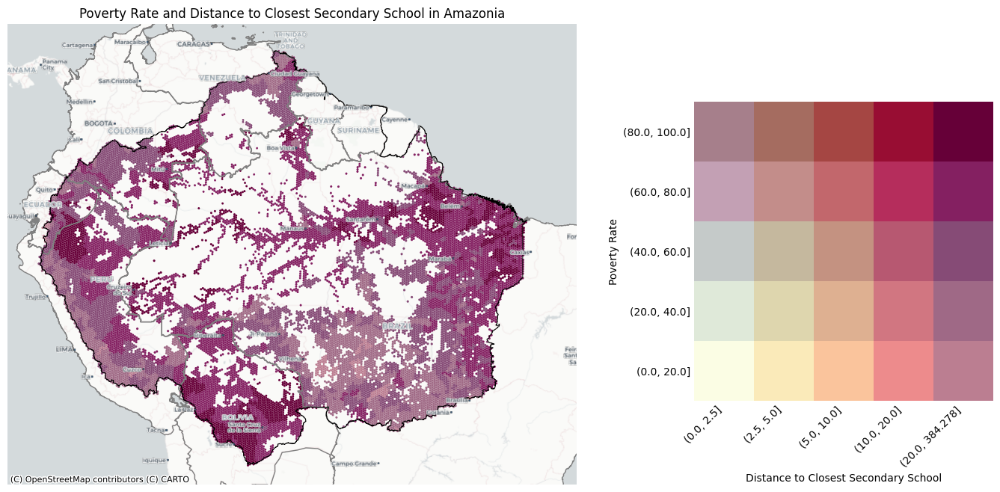

In [125]:
fig, ax = plt.subplots(figsize=(10, 8))

cax = fig.add_axes([1, 0.25, 0.5, 0.5])
cax = xycmap.bivariate_legend(
    ax=cax,
    sx=secondary_schools_dist_cat,
    sy=poverty_rate_categorical,
    cmap=secondary_cmap,
)
cax.set(frame_on=False)
cax.set_xticklabels(secondary_schools_dist_cat.categories, rotation=45, ha="right")
cax.tick_params(axis="both", which="both", length=0)
cax.set_xlabel("Distance to Closest Secondary School")
cax.set_ylabel("Poverty Rate")

hexs_plot = amazonia_complete_downsampled_hexs_5.dropna(
    subset=["poverty_rate_cat", "closest_secondary_school_dist_cat"]
)
# hexs_plot = amazonia_complete_downsampled_hexs_4.dropna(subset="dist_pov_map_colors")
hexs_plot.plot(
    color=hexs_plot["secondary_colors"],
    legend=True,
    figsize=(10, 10),
    ax=ax,
    cax=cax,
    linewidth=0,
)

amzn_countries.plot(facecolor="none", edgecolor="grey", ax=ax, linewidth=1)
amazonas_limits.plot(facecolor="none", edgecolor="black", linewidth=0.7, ax=ax)

ax.set_xlim(-82, -40)
ax.set_ylim(-22, 12)

ax.legend(loc="upper right", bbox_to_anchor=(1.2, 1), frameon=False)

ax.set_axis_off()
ctx.add_basemap(
    ax,
    crs=amazonia_complete_downsampled_hexs_5.crs.to_string(),
    source=ctx.providers.CartoDB.Positron,
)
ctx.add_basemap(
    ax,
    crs=amazonia_complete_downsampled_hexs_5.crs.to_string(),
    source=ctx.providers.CartoDB.PositronOnlyLabels,
)

ax.set_title("Poverty Rate and Distance to Closest Secondary School in Amazonia")

plt.savefig(
    "outputs/map_poverty_rate_x_distance_to_closest_secondary_school.png",
    dpi=300,
    bbox_inches="tight",
    format="png",
)

plt.savefig(
    "outputs/map_poverty_rate_x_distance_to_closest_secondary_school.svg",
    dpi=300,
    bbox_inches="tight",
    format="svg",
)

plt.show()

In [126]:
## Create a crosstab between poverty rate and distance to closest secondary school
crosstab_secondary = pd.crosstab(
    amazonia_complete_downsampled_hexs_5["poverty_rate_cat"],
    amazonia_complete_downsampled_hexs_5["closest_secondary_school_dist_cat"],
    normalize="index",
)
crosstab_secondary * 100

closest_secondary_school_dist_cat,"(0.0, 2.5]","(2.5, 5.0]","(5.0, 10.0]","(10.0, 20.0]","(20.0, 384.278]"
poverty_rate_cat,,,,,
"(0.0, 20.0]",3.301887,8.962264,15.094340,15.094340,57.547170
"(20.0, 40.0]",3.732748,11.700125,18.851945,22.772898,42.942284
"(40.0, 60.0]",2.886881,10.781618,21.798900,26.080126,38.452474
"(60.0, 80.0]",5.472637,13.417760,24.287653,24.046434,32.775516
"(80.0, 100.0]",7.557865,21.303732,27.161077,21.776098,22.201228


In [127]:
# TODOS:
# Pasar graficas y excels por temas [x]
# mapa de distancia con limites de territorio indigena [x]
# mapa de distancia con filtro de incidencia de pobreza [x]
# grafico prop de poblacion a < 2.5km x territorio indigena [x]

### mapas de distancia con limites de territorio indigena


#### primary school


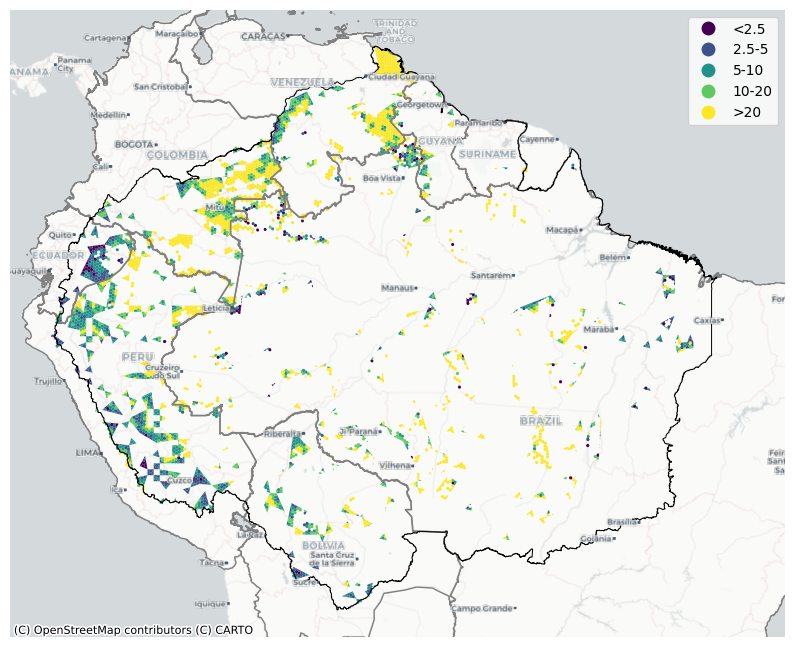

In [128]:
# amazonas_limits.plot(facecolor="none", edgecolor="black", linewidth=0.7)
ax = amazonia_complete_downsampled_hexs_5.clip(
    territorios_indigenas_amazonas.unary_union
).plot(
    "closest_secondary_school_dist_label",
    # ax=ax,
    linewidth=0,
    # alpha=0.5,
    cmap="viridis",
    categories=["<2.5", "2.5-5", "5-10", "10-20", ">20"],
    legend=True,
    figsize=(10, 10),
    # cax=cax,
)
# primary_schools.plot(ax=ax, color="red", markersize=0.01)

bbox = box(-82, -22, -40, 12)
# gpd.GeoSeries(
#     bbox.difference(
#         territorios_indigenas_amazonas.clip(amazonas_limits.geometry[0]).unary_union
#     )
# ).plot(ax=ax, color="black", alpha=0.5)

# territorios_indigenas_amazonas.clip(amazonas_limits.geometry[0]).plot(
#     ax=ax, facecolor="none", edgecolor="red", linewidth=0.7
# )
amzn_countries.plot(facecolor="none", edgecolor="grey", ax=ax, linewidth=1)
amazonas_limits.plot(facecolor="none", edgecolor="black", linewidth=0.7, ax=ax)

ax.set_xlim(-82, -40)
ax.set_ylim(-22, 12)

ctx.add_basemap(
    ax,
    crs=amazonia_complete_downsampled_hexs_5.crs.to_string(),
    source=ctx.providers.CartoDB.Positron,
)
ctx.add_basemap(
    ax,
    crs=amazonia_complete_downsampled_hexs_5.crs.to_string(),
    source=ctx.providers.CartoDB.PositronOnlyLabels,
)
ax.set_axis_off()

plt.savefig(
    "outputs/map_closest_secondary_school_dist_label_territorios_indigenas_v1.png",
    dpi=300,
    bbox_inches="tight",
)
plt.savefig(
    "outputs/map_closest_secondary_school_dist_label_territorios_indigenas_v1.svg",
    dpi=300,
    bbox_inches="tight",
)

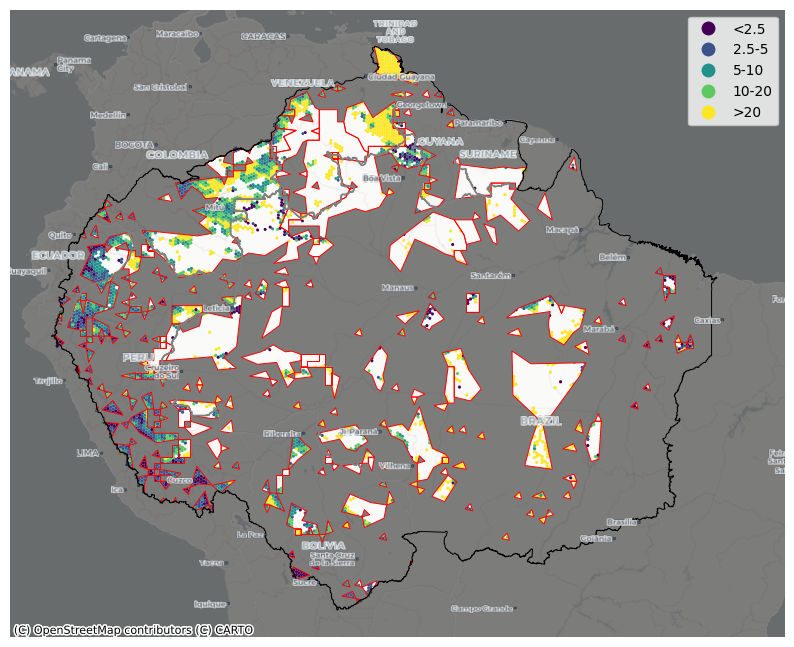

In [129]:
# amazonas_limits.plot(facecolor="none", edgecolor="black", linewidth=0.7)
ax = amazonia_complete_downsampled_hexs_5.clip(
    territorios_indigenas_amazonas.unary_union
).plot(
    "closest_primary_school_dist_label",
    # ax=ax,
    linewidth=0,
    # alpha=0.5,
    cmap="viridis",
    categories=["<2.5", "2.5-5", "5-10", "10-20", ">20"],
    legend=True,
    figsize=(10, 10),
    # cax=cax,
)
# primary_schools.plot(ax=ax, color="red", markersize=0.01)

bbox = box(-82, -22, -40, 12)
gpd.GeoSeries(
    bbox.difference(
        territorios_indigenas_amazonas.clip(amazonas_limits.geometry[0]).unary_union
    )
).plot(ax=ax, color="black", alpha=0.5)

territorios_indigenas_amazonas.clip(amazonas_limits.geometry[0]).plot(
    ax=ax, facecolor="none", edgecolor="red", linewidth=0.7
)
amzn_countries.plot(facecolor="none", edgecolor="grey", ax=ax, linewidth=1)
amazonas_limits.plot(facecolor="none", edgecolor="black", linewidth=0.7, ax=ax)

ax.set_xlim(-82, -40)
ax.set_ylim(-22, 12)

ctx.add_basemap(
    ax,
    crs=amazonia_complete_downsampled_hexs_5.crs.to_string(),
    source=ctx.providers.CartoDB.Positron,
)
ctx.add_basemap(
    ax,
    crs=amazonia_complete_downsampled_hexs_5.crs.to_string(),
    source=ctx.providers.CartoDB.PositronOnlyLabels,
)
ax.set_axis_off()

plt.savefig(
    "outputs/map_closest_primary_school_dist_label_territorios_indigenas_v2.png",
    dpi=300,
    bbox_inches="tight",
)
plt.savefig(
    "outputs/map_closest_primary_school_dist_label_territorios_indigenas_v2.svg",
    dpi=300,
    bbox_inches="tight",
)

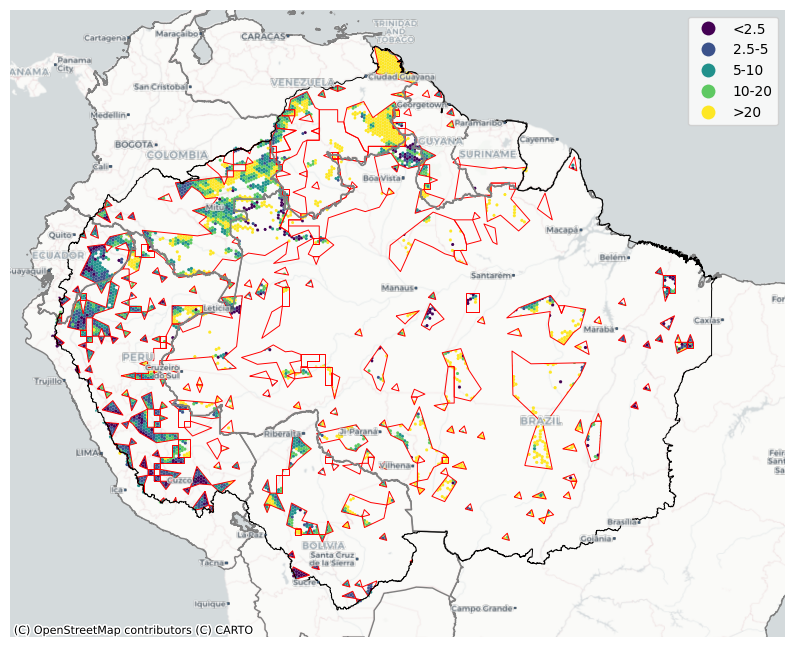

In [130]:
# amazonas_limits.plot(facecolor="none", edgecolor="black", linewidth=0.7)
ax = amazonia_complete_downsampled_hexs_5.clip(
    territorios_indigenas_amazonas.unary_union
).plot(
    "closest_primary_school_dist_label",
    # ax=ax,
    linewidth=0,
    # alpha=0.5,
    cmap="viridis",
    categories=["<2.5", "2.5-5", "5-10", "10-20", ">20"],
    legend=True,
    figsize=(10, 10),
    # cax=cax,
)
# primary_schools.plot(ax=ax, color="red", markersize=0.01)

bbox = box(-82, -22, -40, 12)
# gpd.GeoSeries(
#     bbox.difference(
#         territorios_indigenas_amazonas.clip(amazonas_limits.geometry[0]).unary_union
#     )
# ).plot(ax=ax, color="black", alpha=0.5)

territorios_indigenas_amazonas.clip(amazonas_limits.geometry[0]).plot(
    ax=ax, facecolor="none", edgecolor="red", linewidth=0.7
)
amzn_countries.plot(facecolor="none", edgecolor="grey", ax=ax, linewidth=1)
amazonas_limits.plot(facecolor="none", edgecolor="black", linewidth=0.7, ax=ax)

ax.set_xlim(-82, -40)
ax.set_ylim(-22, 12)

ctx.add_basemap(
    ax,
    crs=amazonia_complete_downsampled_hexs_5.crs.to_string(),
    source=ctx.providers.CartoDB.Positron,
)
ctx.add_basemap(
    ax,
    crs=amazonia_complete_downsampled_hexs_5.crs.to_string(),
    source=ctx.providers.CartoDB.PositronOnlyLabels,
)
ax.set_axis_off()

plt.savefig(
    "outputs/map_closest_primary_school_dist_label_territorios_indigenas_v3.png",
    dpi=300,
    bbox_inches="tight",
)
plt.savefig(
    "outputs/map_closest_primary_school_dist_label_territorios_indigenas_v3.svg",
    dpi=300,
    bbox_inches="tight",
)

### mapa de distancia con filtro de incidencia de pobreza


poverty_rate_filter = (
amazonia_complete_downsampled_hexs_5["poverty_rate_cat"] > amazonia_complete_downsampled_hexs_5["poverty_rate_cat"].unique()[2]
)


#### primary school


In [131]:
amazonia_complete_downsampled_hexs_5["poverty_rate_cat"].value_counts().sort_index()

poverty_rate_cat
(0.0, 20.0]       212
(20.0, 40.0]     3188
(40.0, 60.0]     5092
(60.0, 80.0]     6633
(80.0, 100.0]    2117
Name: count, dtype: int64

<Axes: >

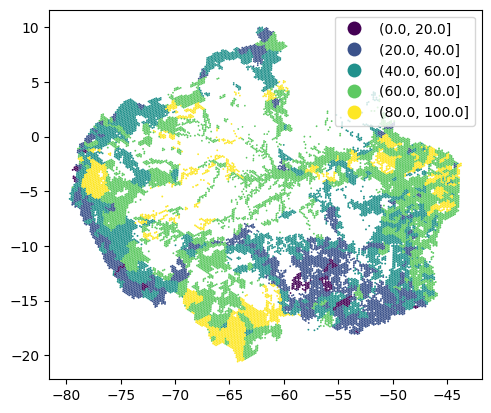

In [132]:
amazonia_complete_downsampled_hexs_5.dropna(subset=["poverty_rate_cat"]).plot(
    "poverty_rate_cat", legend=True, categorical=True, cmap="viridis"
)

In [133]:
poverty_rate_filter = amazonia_complete_downsampled_hexs_5[
    "poverty_rate_cat"
] > pd.Interval(33, 66, closed="right")

In [134]:
merged_cells = gpd.GeoSeries(
    [amazonia_complete_downsampled_hexs_5[poverty_rate_filter].geometry.unary_union],
    crs=amazonia_complete_downsampled_hexs_5.crs,
)

<Axes: >

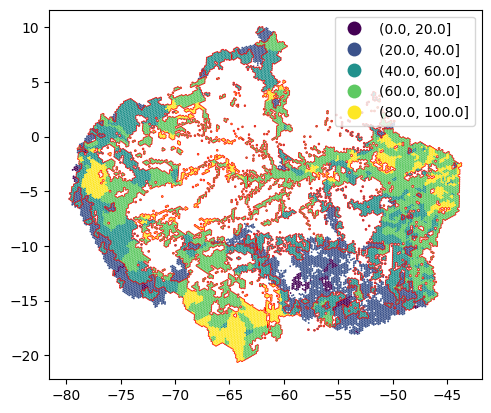

In [135]:
ax = amazonia_complete_downsampled_hexs_5.plot(
    "poverty_rate_cat", legend=True, categorical=True, cmap="viridis"
)
merged_cells.plot(ax=ax, edgecolor="red", linewidth=0.5, facecolor="none")

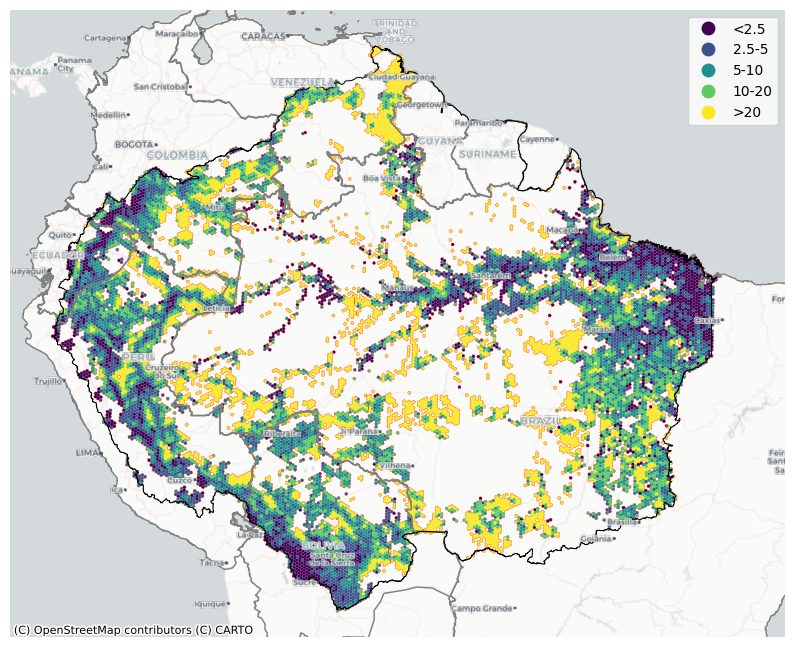

In [136]:
ax = amazonia_complete_downsampled_hexs_5[poverty_rate_filter].plot(
    "closest_primary_school_dist_label",
    linewidth=0,
    cmap="viridis",
    categories=["<2.5", "2.5-5", "5-10", "10-20", ">20"],
    legend=True,
    figsize=(10, 10),
)
merged_cells.plot(ax=ax, edgecolor="red", linewidth=0.2, facecolor="none")

bbox = box(-82, -22, -40, 12)
# gpd.GeoSeries(
#     bbox.difference(
#         territorios_indigenas_amazonas.clip(amazonas_limits.geometry[0]).unary_union
#     )
# ).plot(ax=ax, color="black", alpha=0.5)

# territorios_indigenas_amazonas.clip(amazonas_limits.geometry[0]).plot(
#     ax=ax, facecolor="none", edgecolor="red", linewidth=0.7
# )
amzn_countries.plot(facecolor="none", edgecolor="grey", ax=ax, linewidth=1)
amazonas_limits.plot(facecolor="none", edgecolor="black", linewidth=0.7, ax=ax)

ax.set_xlim(-82, -40)
ax.set_ylim(-22, 12)

ctx.add_basemap(
    ax,
    crs=amazonia_complete_downsampled_hexs_5.crs.to_string(),
    source=ctx.providers.CartoDB.Positron,
)
ctx.add_basemap(
    ax,
    crs=amazonia_complete_downsampled_hexs_5.crs.to_string(),
    source=ctx.providers.CartoDB.PositronOnlyLabels,
)
ax.set_axis_off()

plt.savefig(
    "outputs/map_closest_primary_school_dist_label_high_poverty_rate.png",
    dpi=300,
    bbox_inches="tight",
)
plt.savefig(
    "outputs/map_closest_primary_school_dist_label_high_poverty_rate.svg",
    dpi=300,
    bbox_inches="tight",
)

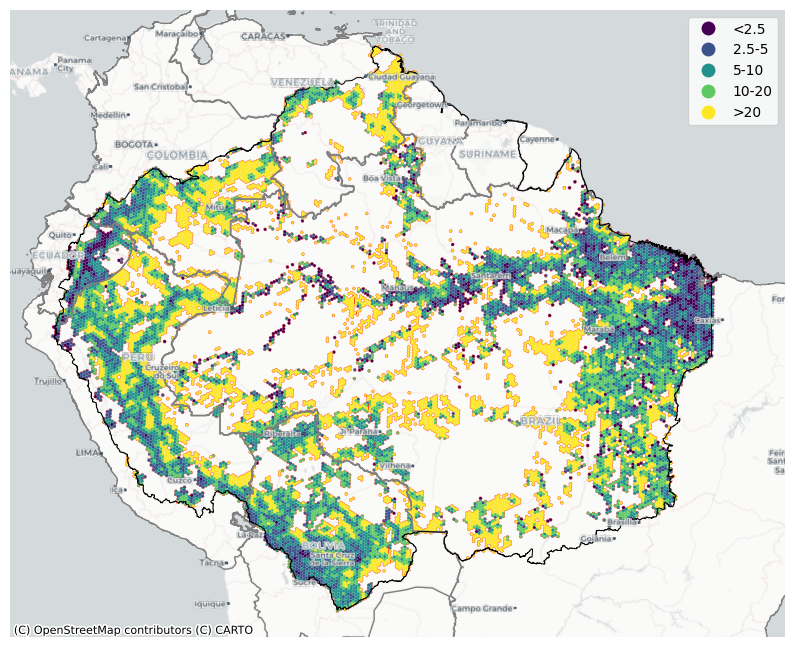

In [137]:
ax = amazonia_complete_downsampled_hexs_5[poverty_rate_filter].plot(
    "closest_secondary_school_dist_label",
    linewidth=0,
    cmap="viridis",
    categories=["<2.5", "2.5-5", "5-10", "10-20", ">20"],
    legend=True,
    figsize=(10, 10),
)
merged_cells.plot(ax=ax, edgecolor="red", linewidth=0.2, facecolor="none")

bbox = box(-82, -22, -40, 12)
# gpd.GeoSeries(
#     bbox.difference(
#         territorios_indigenas_amazonas.clip(amazonas_limits.geometry[0]).unary_union
#     )
# ).plot(ax=ax, color="black", alpha=0.5)

# territorios_indigenas_amazonas.clip(amazonas_limits.geometry[0]).plot(
#     ax=ax, facecolor="none", edgecolor="red", linewidth=0.7
# )
amzn_countries.plot(facecolor="none", edgecolor="grey", ax=ax, linewidth=1)
amazonas_limits.plot(facecolor="none", edgecolor="black", linewidth=0.7, ax=ax)

ax.set_xlim(-82, -40)
ax.set_ylim(-22, 12)

ctx.add_basemap(
    ax,
    crs=amazonia_complete_downsampled_hexs_5.crs.to_string(),
    source=ctx.providers.CartoDB.Positron,
)
ctx.add_basemap(
    ax,
    crs=amazonia_complete_downsampled_hexs_5.crs.to_string(),
    source=ctx.providers.CartoDB.PositronOnlyLabels,
)
ax.set_axis_off()

plt.savefig(
    "outputs/map_closest_secondary_school_dist_label_high_poverty_rate.png",
    dpi=300,
    bbox_inches="tight",
)
plt.savefig(
    "outputs/map_closest_secondary_school_dist_label_high_poverty_rate.svg",
    dpi=300,
    bbox_inches="tight",
)

### grafico prop de poblacion a < 2.5km x territorio indigena


#### primary school


In [138]:
amazonia_complete_hexs.columns

Index(['country', 'hex', 'pob_primaria', 'pob_secundaria',
       'closest_primary_school_id', 'closest_primary_school_dist',
       'closest_secondary_school_id', 'closest_secondary_school_dist', 'lat',
       'lon', 'geometry', 'closest_primary_school_dist_cat',
       'closest_secondary_school_dist_cat',
       'closest_primary_school_dist_clipped', 'territorio_indigena',
       'protected_area', 'poverty_rate_cat', 'primary_school_dist_less_2_5km',
       'secondary_school_dist_less_2_5km'],
      dtype='object')

<Figure size 1400x700 with 0 Axes>

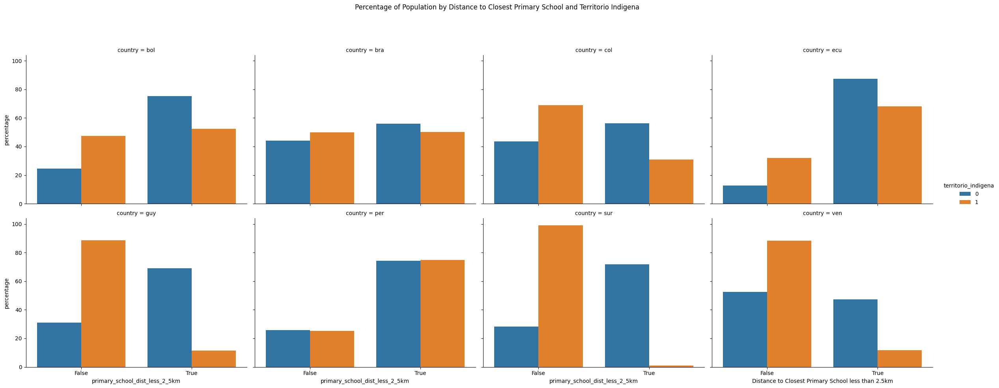

In [139]:
# Calculate the population within 2.5km of the closest primary school
pop_primaria_by_school_dist_2_5_km_country_territorio_indigena = (
    amazonia_complete_hexs.groupby(
        ["country", "territorio_indigena", "primary_school_dist_less_2_5km"]
    )["pob_primaria"]
    .sum()
    .reset_index()
)

# Calculate the total population by country and poverty category
total_population = (
    pop_primaria_by_school_dist_2_5_km_country_territorio_indigena.groupby(
        ["country", "territorio_indigena"]
    )["pob_primaria"]
    .sum()
    .reset_index()
)

# Merge the total population back to the original dataframe
df = pop_primaria_by_school_dist_2_5_km_country_territorio_indigena.merge(
    total_population, on=["country", "territorio_indigena"], suffixes=("", "_total")
)

# Calculate the percentage of population in each distance category
df["percentage"] = (df["pob_primaria"] / df["pob_primaria_total"]) * 100

# Create the plot
plt.figure(figsize=(14, 7))
sns.catplot(
    data=df,
    x="primary_school_dist_less_2_5km",
    y="percentage",
    hue="territorio_indigena",
    col="country",
    kind="bar",
    height=5,
    aspect=1.2,
    col_wrap=4,
)

# Adjust the labels and titles
plt.subplots_adjust(top=0.85)

plt.suptitle(
    "Percentage of Population by Distance to Closest Primary School and Territorio Indigena"
)

plt.xlabel("Distance to Closest Primary School less than 2.5km")
plt.ylabel("Percentage of Primary School Population")

# Save the plot
plt.savefig(
    "outputs/pop_primaria_by_school_dist_2_5_km_country_territorio_indigena.png",
    dpi=300,
    bbox_inches="tight",
    format="png",
)

plt.savefig(
    "outputs/pop_primaria_by_school_dist_2_5_km_country_territorio_indigena.svg",
    dpi=300,
    bbox_inches="tight",
    format="svg",
)

# Show the plot
plt.show()

In [140]:
# Save the data
df.to_excel(
    "outputs/pop_primaria_by_school_dist_2_5_km_country_territorio_indigena.xlsx"
)

#### secondary school


<Figure size 1400x700 with 0 Axes>

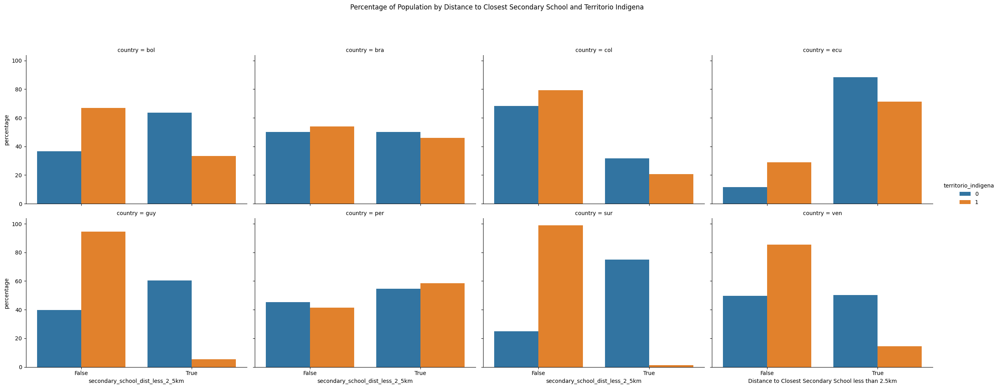

In [141]:
# Calculate the population within 2.5km of the closest secondary school
pop_secundaria_by_school_dist_2_5_km_country_territorio_indigena = (
    amazonia_complete_hexs.groupby(
        ["country", "territorio_indigena", "secondary_school_dist_less_2_5km"]
    )["pob_secundaria"]
    .sum()
    .reset_index()
)

# Calculate the total population by country and poverty category
total_population = (
    pop_secundaria_by_school_dist_2_5_km_country_territorio_indigena.groupby(
        ["country", "territorio_indigena"]
    )["pob_secundaria"]
    .sum()
    .reset_index()
)

# Merge the total population back to the original dataframe
df = pop_secundaria_by_school_dist_2_5_km_country_territorio_indigena.merge(
    total_population, on=["country", "territorio_indigena"], suffixes=("", "_total")
)

# Calculate the percentage of population in each distance category
df["percentage"] = (df["pob_secundaria"] / df["pob_secundaria_total"]) * 100

# Create the plot
plt.figure(figsize=(14, 7))
sns.catplot(
    data=df,
    x="secondary_school_dist_less_2_5km",
    y="percentage",
    hue="territorio_indigena",
    col="country",
    kind="bar",
    height=5,
    aspect=1.2,
    col_wrap=4,
)

# Adjust the labels and titles
plt.subplots_adjust(top=0.85)

plt.suptitle(
    "Percentage of Population by Distance to Closest Secondary School and Territorio Indigena"
)

plt.xlabel("Distance to Closest Secondary School less than 2.5km")
plt.ylabel("Percentage of Secondary School Population")

# Save the plot
plt.savefig(
    "outputs/pop_secundaria_by_school_dist_2_5_km_country_territorio_indigena.png",
    dpi=300,
    bbox_inches="tight",
    format="png",
)

plt.savefig(
    "outputs/pop_secundaria_by_school_dist_2_5_km_country_territorio_indigena.svg",
    dpi=300,
    bbox_inches="tight",
    format="svg",
)

# Show the plot
plt.show()

In [142]:
# Save the data
df.to_excel(
    "outputs/pop_secundaria_by_school_dist_2_5_km_country_territorio_indigena.xlsx"
)